### Importing the necessary packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import seaborn as sns
import datetime
import time
from dateutil.parser import parse
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth
from IPython.display import Markdown, display
import warnings
from collections import Counter
import json
import pyfpgrowth
from IPython.display import Markdown, display

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Helper Functions

In [2]:
def printmd(string):
    display(Markdown(string))
# printmd('**bold**')

def top5(y):
    dic = {}
    topcat = []
    for i in y:
        if i in dic:
            dic[i] += 1
        else:
            dic[i] = 1
    x = dic.values()
    avg = sum(x)/len(x)
    category = sorted(dic, key = dic.get, reverse = True) 
    for i in category:
        if dic[i] > avg:
            topcat.append(i)
    return topcat

def dateformat(alldates):
    newdate = []
    for i in alldates:
        a = i.split('.')
        b = '20' + a[0] + '-' + a[2] + '-' + a[1]
        b = datetime.datetime.strptime(b, '%Y-%m-%d')
        newdate.append(b)
    return newdate

PLOT_COLORS = ["#268bd2", "#0052CC", "#FF5722", "#b58900", "#003f5c"]
pd.options.display.float_format = '{:.2f}'.format
sns.set(style="ticks")
plt.rc('figure', figsize=(8, 5), dpi=100)
plt.rc('axes', labelpad=20, facecolor="#ffffff", linewidth=0.4, grid=True, labelsize=14)
plt.rc('patch', linewidth=0)
plt.rc('xtick.major', width=0.2)
plt.rc('ytick.major', width=0.2)
plt.rc('grid', color='#9E9E9E', linewidth=0.4)
plt.rc('font', family='Arial', weight='400', size=10)
plt.rc('text', color='#282828')
plt.rc('savefig', pad_inches=0.3, dpi=300)

def dataAnalysis(dataset_name):
    temp = dataset_name[:2]
#     hello = termcolor.colored(temp, attrs=['bold', 'dark', 'underline', 'reverse'])
#     print(hello)

    df = pd.read_csv(dataset_name, encoding='latin1')
    cdf = df["trending_date"].apply(lambda x: '20' + x[:2]).value_counts() \
                .to_frame().reset_index() \
                .rename(columns={"index": "year", "trending_date": "No_of_videos"})

    fig, ax = plt.subplots()
    _ = sns.barplot(x="year", y="No_of_videos", data=cdf, 
                    palette=sns.color_palette(['#ff764a', '#ffa600'], n_colors=7), ax=ax)
    _ = ax.set(xlabel="Year", ylabel="No. of videos", title = "Dataset Collection Years for " + str(temp))
    
    fig, ax = plt.subplots()
    _ = sns.distplot(df[df["views"] < 25e6]["views"], kde=False, 
                     color=PLOT_COLORS[4], hist_kws={'alpha': 1}, ax=ax)
    _ = ax.set(xlabel="Views", ylabel="No. of videos", title = "Views Histogram for " + str(temp))
    
    fig, ax = plt.subplots()
    _ = sns.distplot(df[df["likes"] <= 1e5]["likes"], kde=False, 
                     color=PLOT_COLORS[4], hist_kws={'alpha': 1}, ax=ax)
    _ = ax.set(xlabel="Likes", ylabel="No. of videos", title = "Likes Histogram for " + str(temp))
    
    
    fig, ax = plt.subplots()
    _ = sns.distplot(df[df["comment_count"] < 200000]["comment_count"], kde=False, rug=False, 
                     color=PLOT_COLORS[4], hist_kws={'alpha': 1}, 
                     bins=np.linspace(0, 2e5, 49), ax=ax)
    _ = ax.set(xlabel="Comment Count", ylabel="No. of videos", title = "Comment Count Histogram for " + str(temp))
    
    jsonName = dataset_name[:2] + "_category_id.json"
    with open(jsonName) as f:
        categories = json.load(f)["items"]
    cat_dict = {}
    for cat in categories:
        cat_dict[int(cat["id"])] = cat["snippet"]["title"]
    df['category_name'] = df['category_id'].map(cat_dict)
    
    cdf = df["category_name"].value_counts().to_frame().reset_index()
    cdf.rename(columns={"index": "category_name", "category_name": "No_of_videos"}, inplace=True)
    fig, ax = plt.subplots()
    _ = sns.barplot(x="category_name", y="No_of_videos", data=cdf, 
                    palette=sns.cubehelix_palette(n_colors=16, reverse=True), ax=ax)
    _ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    _ = ax.set(xlabel="Category", ylabel="No. of videos", title = "Highest Categories Count for " + str(temp))
    

    
def mainfunc(dataset_name):
    datapath = dataset_name
    df = pd.read_csv(datapath, encoding='latin1')
    printmd("## **" + dataset_name[:2] + "**")
    temp = dataset_name[:2] + "_category_id.json"
    with open(temp) as f:
        categories = json.load(f)["items"]
    cat_dict = {}
    for cat in categories:
        cat_dict[int(cat["id"])] = cat["snippet"]["title"]
    df['category_name'] = df['category_id'].map(cat_dict)
    dataset = []
    dates = df['trending_date'].unique()
    for i in dates:
        x = df.loc[df['trending_date'] == i]
        y = list(x['category_name'])
        temp = top5(y)
        dataset.append(temp)
    alldates = list(df['trending_date'])
    newdate = dateformat(alldates)
    df['Date'] = newdate
    return dataset, df

In [3]:
import networkx 
import matplotlib.pyplot as plt


def linkage(rules, displayed):
    graph = networkx.DiGraph()
    color_map = []
    c = 30
    colours = np.random.rand(c)
    links = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11']

    for i in range(displayed):
        graph.add_nodes_from(["C" + str(i)])
        for a in rules.iloc[i]['antecedents']:
            graph.add_nodes_from([a])
            graph.add_edge(a, "C" + str(i), color=colours[i], weight=2)
        for c in rules.iloc[i]['consequents']:
            graph.add_nodes_from([c])
            graph.add_edge("C" + str(i), c, color=colours[i], weight=2)
    for node in graph:
        str_loc = False
        for item in links:
            if node == item:
                str_loc = True
        if str_loc:
            color_map.append('red')
        else:
            color_map.append('blue')

    edges = graph.edges()
    colours = [graph[i][j]['color'] for i, j in edges]
    weights = [graph[i][j]['weight'] for i, j in edges]

    pos = networkx.spring_layout(graph, k=12, scale=1)
    networkx.draw(graph, pos, edges=edges, node_color=color_map, edge_color=colours, width=weights, font_size=12,
                  with_labels=False)

    networkx.draw_networkx_labels(graph, pos)
    plt.show()

## Data Analysis and Visualization

/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control

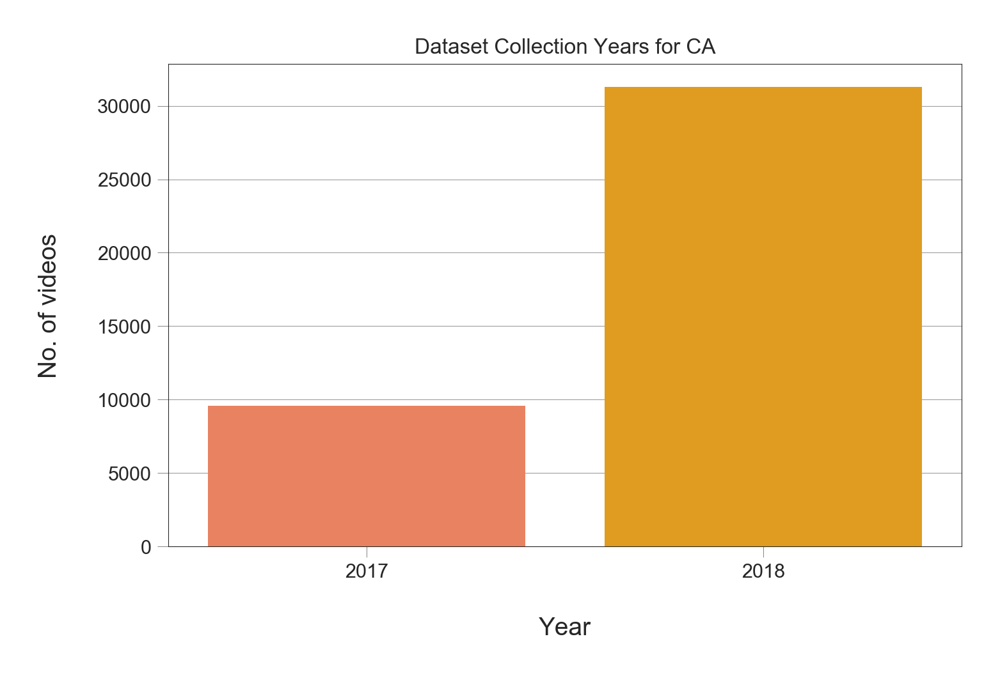

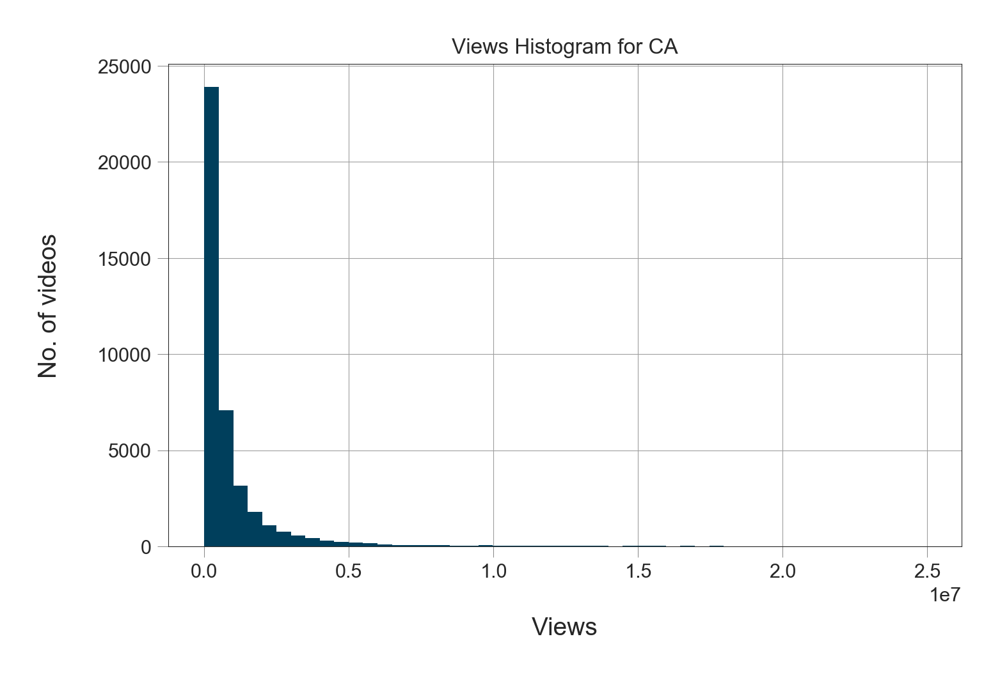

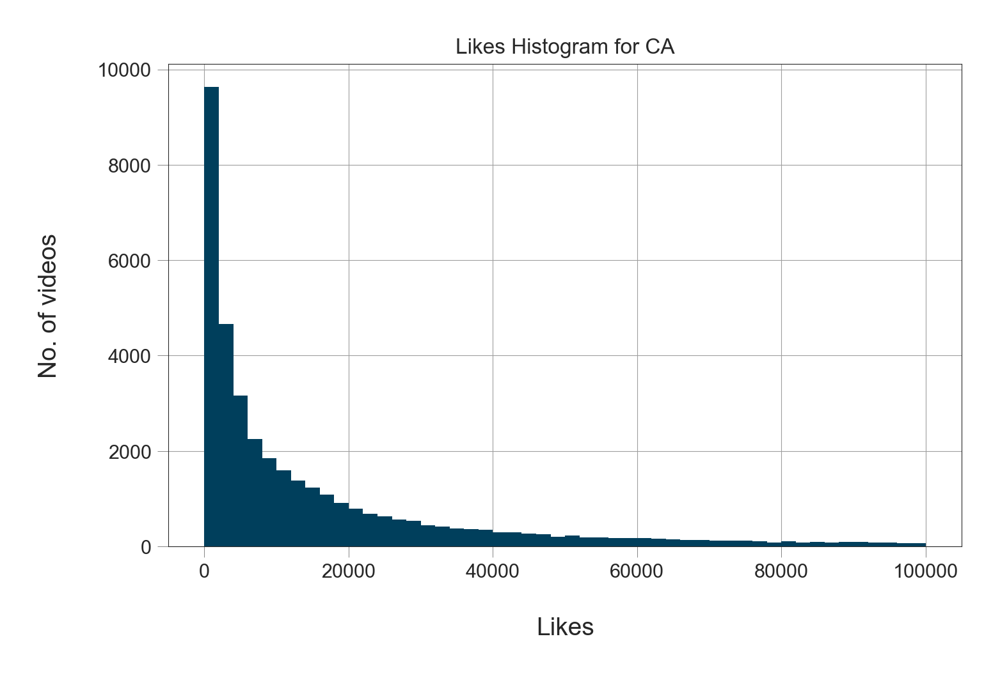

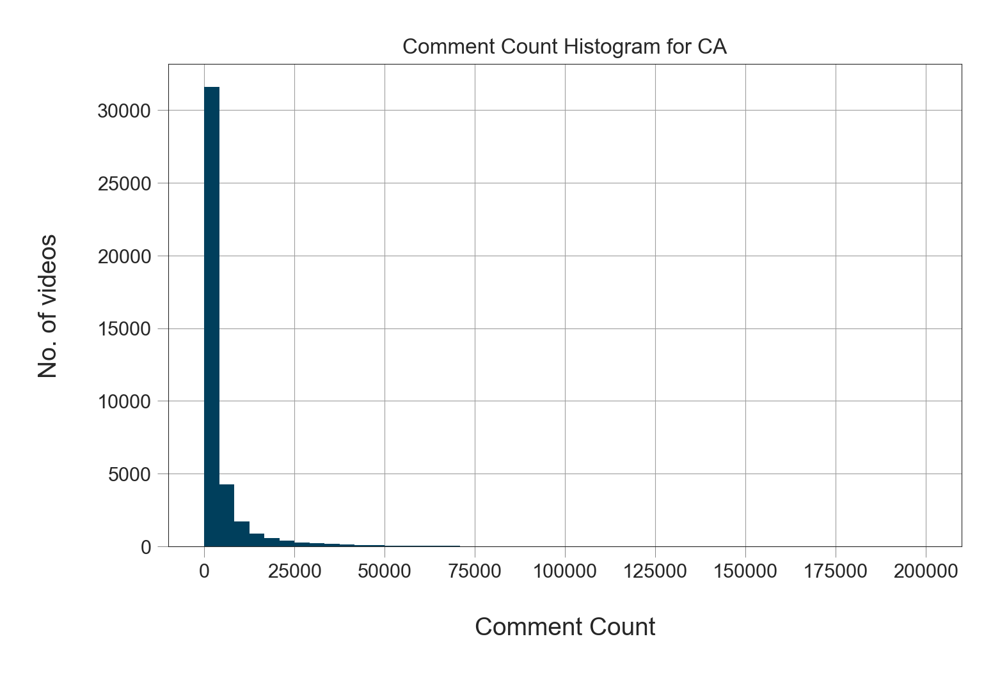

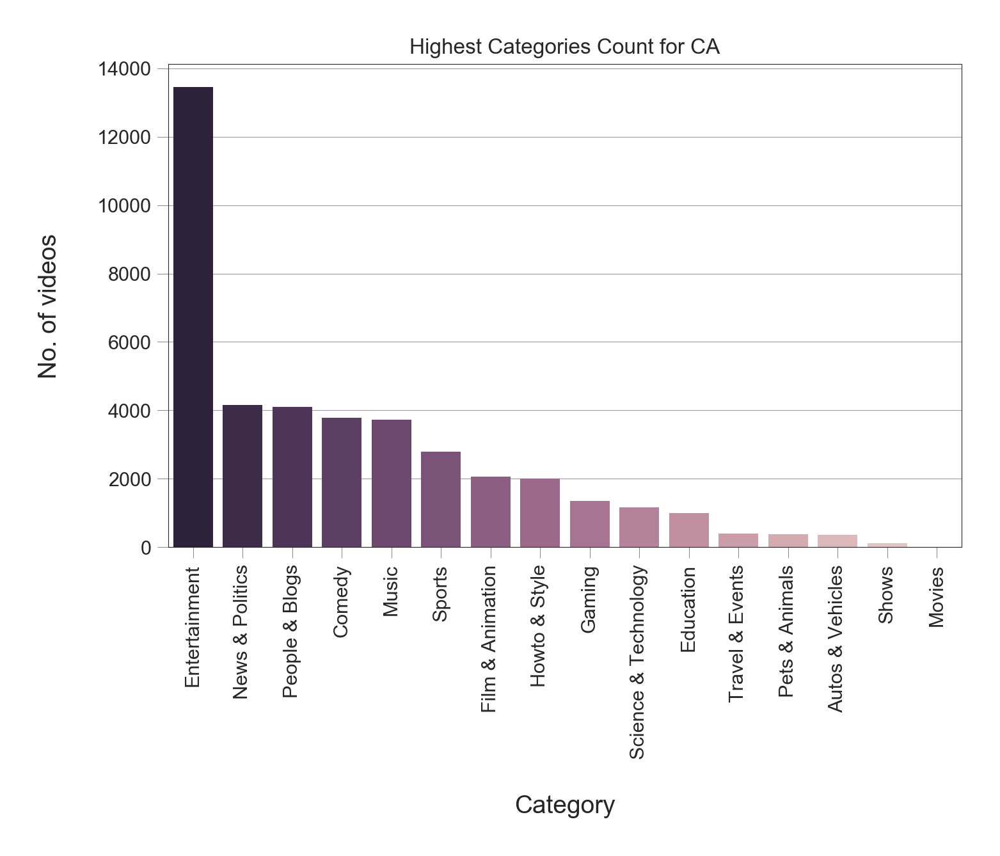

...

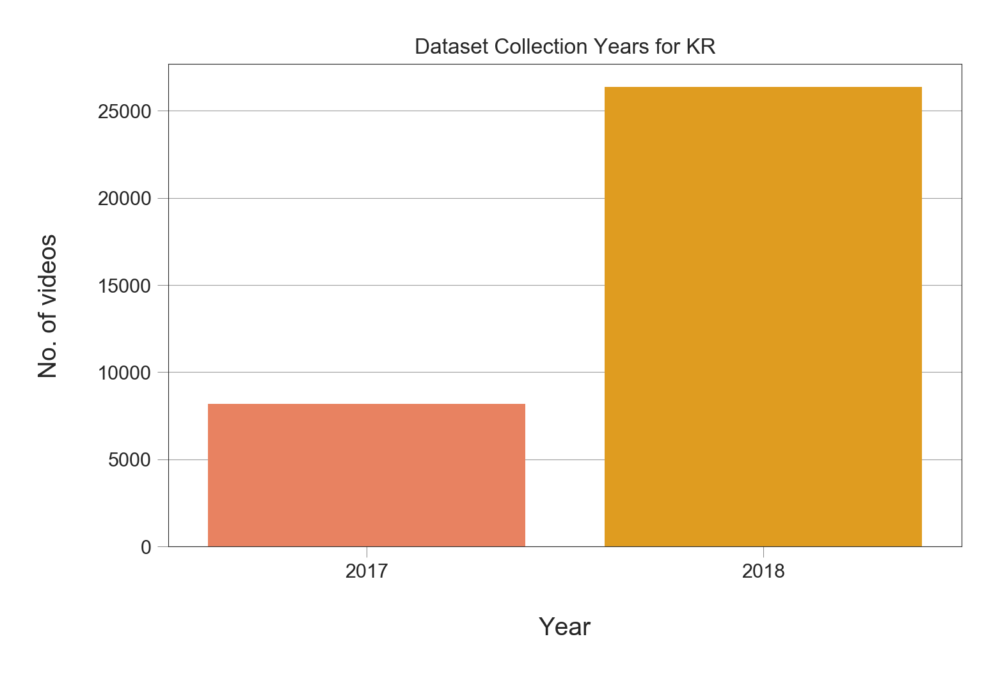

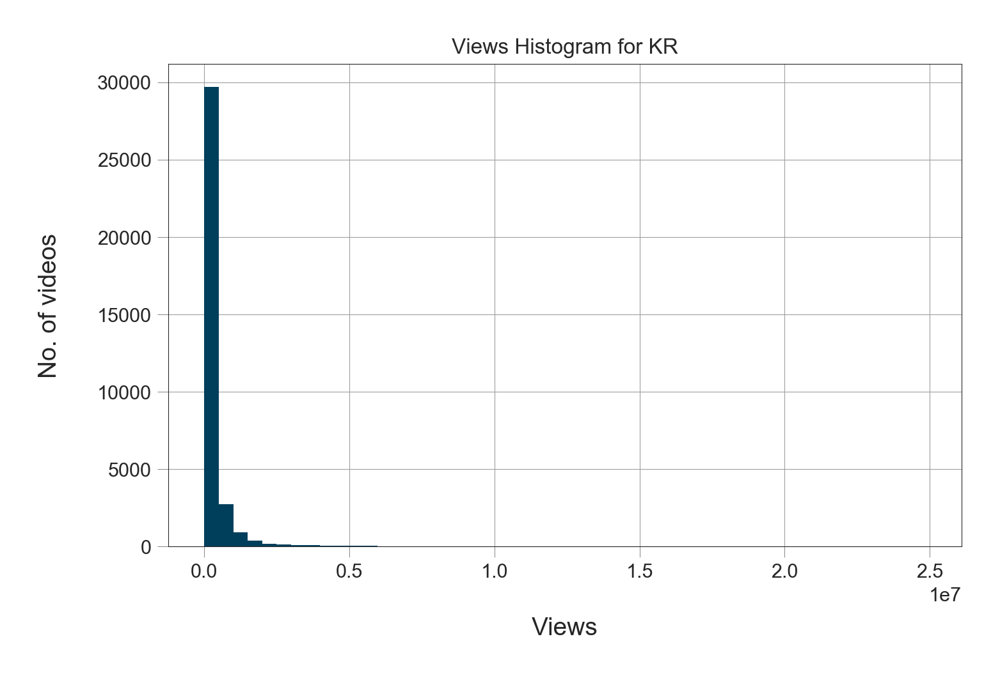

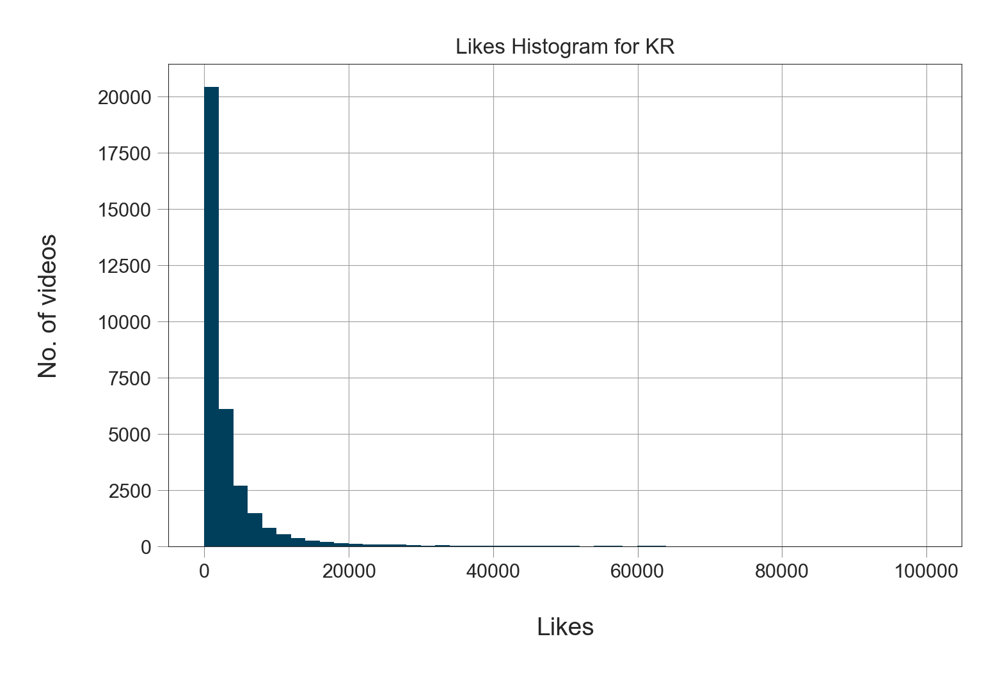

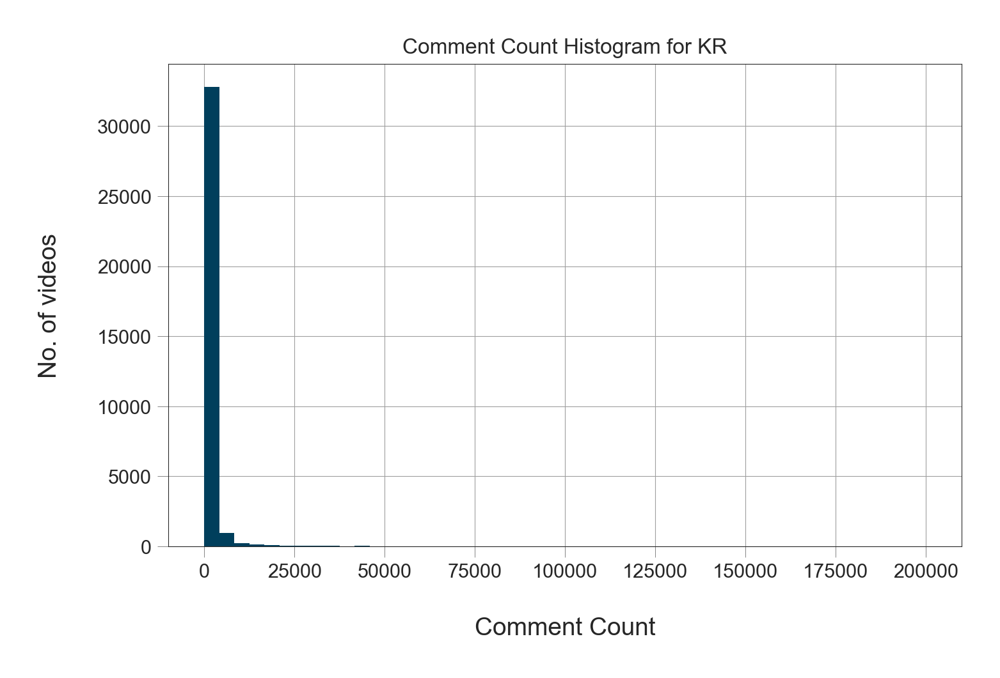

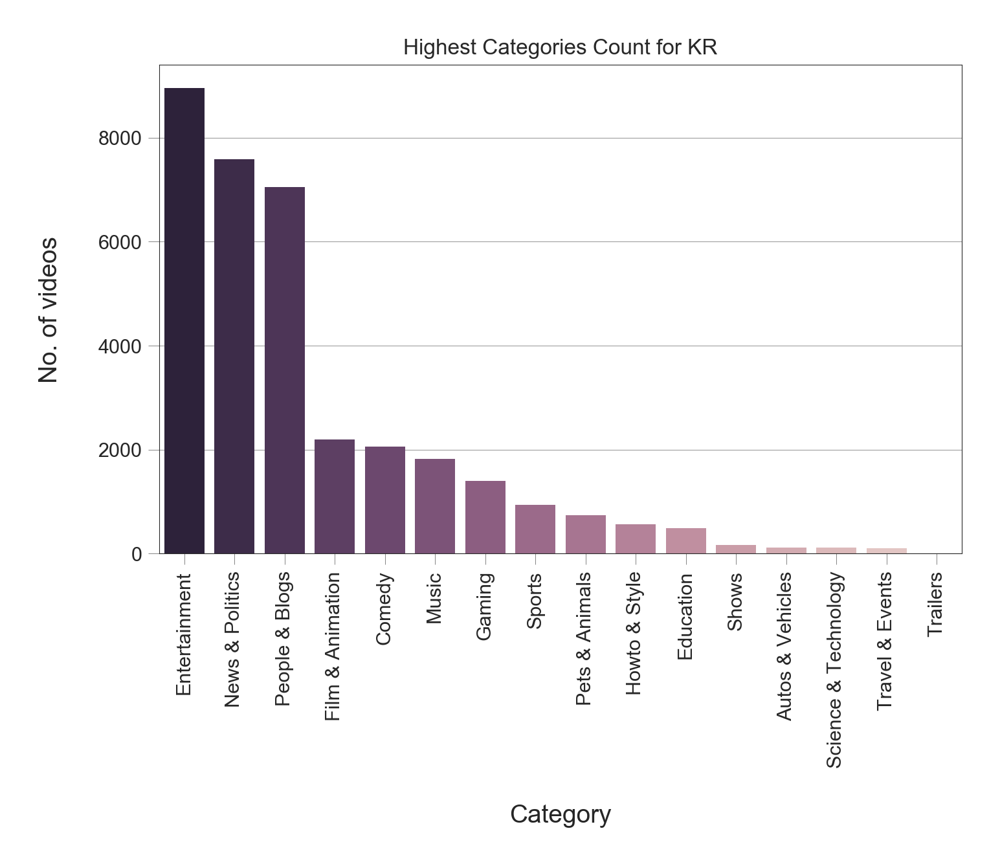

In [4]:
datasets = ["CAvideos.csv", "DEvideos.csv", "FRvideos.csv", "GBvideos.csv", "INvideos.csv", "USvideos.csv", "MXvideos.csv", "JPvideos.csv", "KRvideos.csv"]
for i in datasets:
    dataAnalysis(i)

# Model A: Apriori Model

In [5]:
def apriori_model(dataset_name):
    dataset, df = mainfunc(dataset_name)
    dataforapriori = {'date': df['trending_date'].unique(), 'top_trending': dataset}
    apdata = pd.DataFrame(data = dataforapriori)
    for i in range(len(apdata['top_trending'])):
        x = apdata.iloc[i,1]
        for j in x:
            apdata.at[i, j] = int(1)
    apdata.fillna(0, inplace = True)
    apdata_ = apdata.drop(['date','top_trending'],axis=1)
    frq_items = apriori(apdata_,0.6, use_colnames=True)
    rules = association_rules(frq_items, metric ="lift", min_threshold = 1)
    rules = pd.DataFrame(rules)
    rules1 = rules.sort_values(['confidence', 'lift'], ascending =[False, False])
    no_of_rules = len(rules1)
    if no_of_rules>=10:
        count = 10
    else:
        count = no_of_rules
    display(rules1)
    x = list(rules1['support'])
    y = list(rules1['confidence'])
    plt.scatter(x, y)
    plt.title('Support vs Confidence for Rules')
    plt.xlabel('Support')
    plt.ylabel('Confidence')
    plt.show()
    return rules1, count

## **CA**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1,(People & Blogs),(Entertainment),0.89,1.00,0.89,1.00,1.00,0.00,inf
3,(Comedy),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
5,(News & Politics),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
7,(Music),(Entertainment),0.79,1.00,0.79,1.00,1.00,0.00,inf
14,"(People & Blogs, Comedy)",(Entertainment),0.77,1.00,0.77,1.00,1.00,0.00,inf
18,"(People & Blogs, News & Politics)",(Entertainment),0.78,1.00,0.78,1.00,1.00,0.00,inf
24,"(People & Blogs, Music)",(Entertainment),0.72,1.00,0.72,1.00,1.00,0.00,inf
30,"(Comedy, News & Politics)",(Entertainment),0.75,1.00,0.75,1.00,1.00,0.00,inf
34,"(Comedy, Music)",(Entertainment),0.66,1.00,0.66,1.00,1.00,0.00,inf
36,"(News & Politics, Music)",(Entertainment),0.67,1.00,0.67,1.00,1.00,0.00,inf


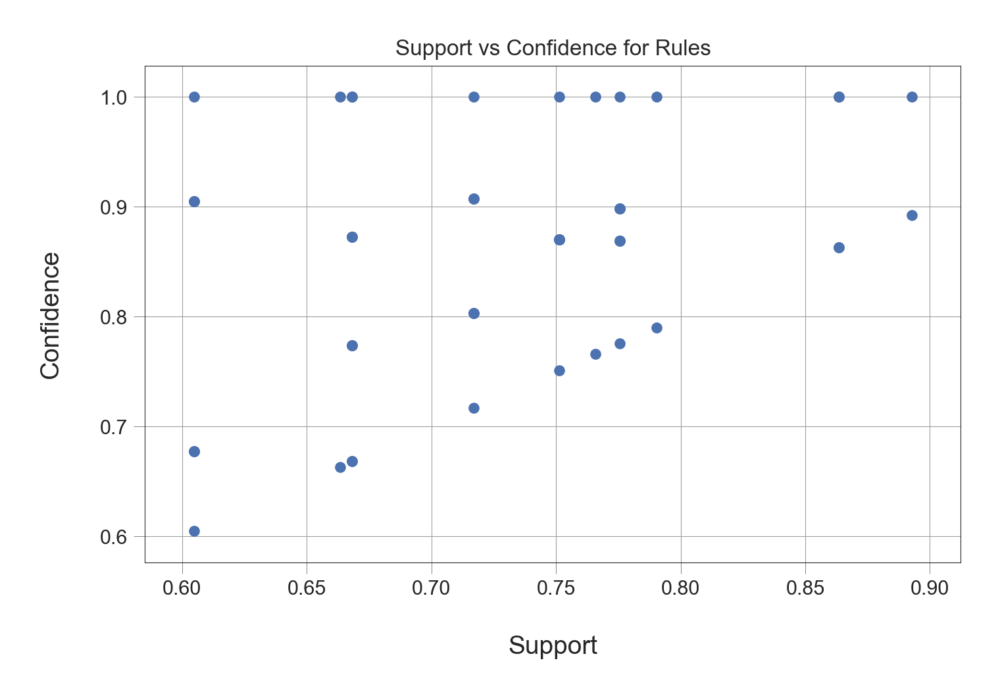

/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:585: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  and cb.iterable(edge_color) \
/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:595: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  for c in edge_color]):
/Users/samridkc/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable

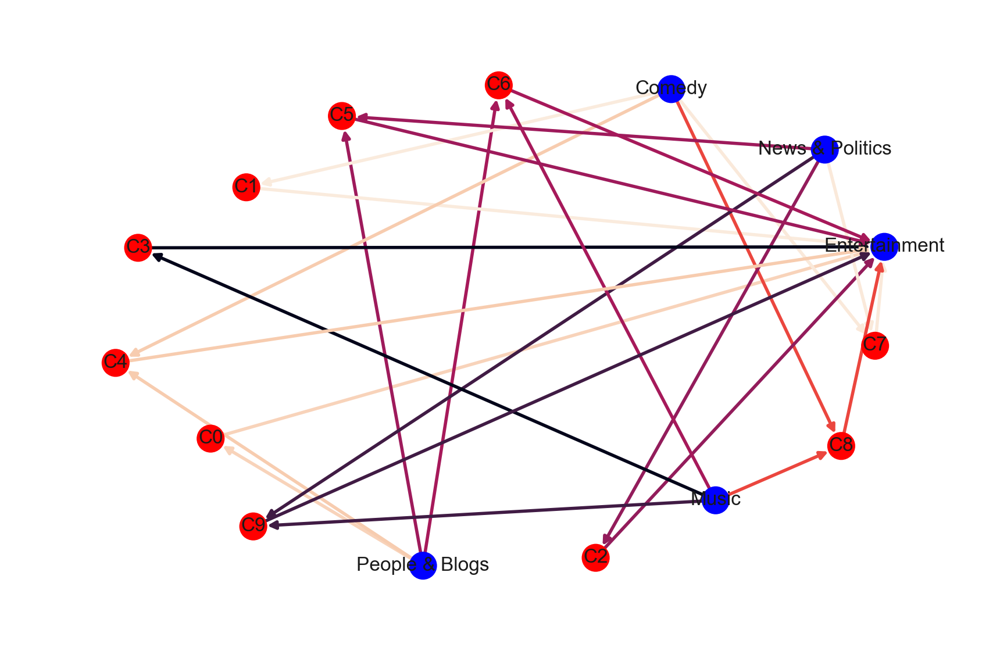

## **DE**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


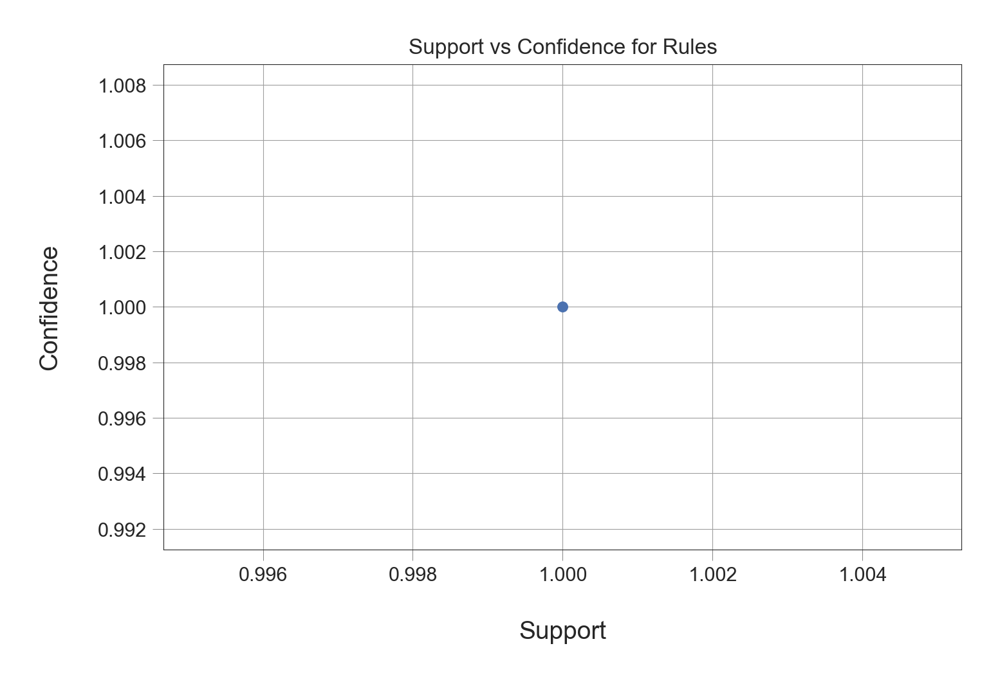

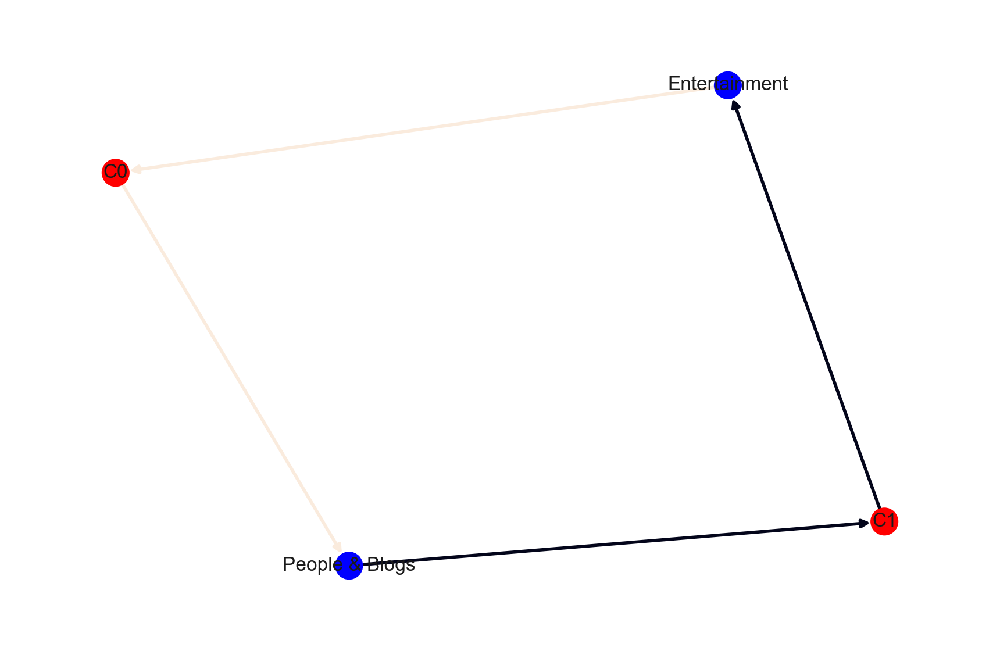

## **FR**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1,(Sports),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
2,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
3,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
5,(Comedy),(Entertainment),0.90,1.00,0.90,1.00,1.00,0.00,inf
7,(Music),(Entertainment),0.79,1.00,0.79,1.00,1.00,0.00,inf
...,...,...,...,...,...,...,...,...,...
35,(Entertainment),"(News & Politics, Sports)",1.00,0.63,0.63,0.63,1.00,0.00,1.00
71,(People & Blogs),"(News & Politics, Sports)",1.00,0.63,0.63,0.63,1.00,0.00,1.00
99,"(Entertainment, People & Blogs)","(News & Politics, Sports)",1.00,0.63,0.63,0.63,1.00,0.00,1.00
104,(Entertainment),"(People & Blogs, News & Politics, Sports)",1.00,0.63,0.63,0.63,1.00,0.00,1.00


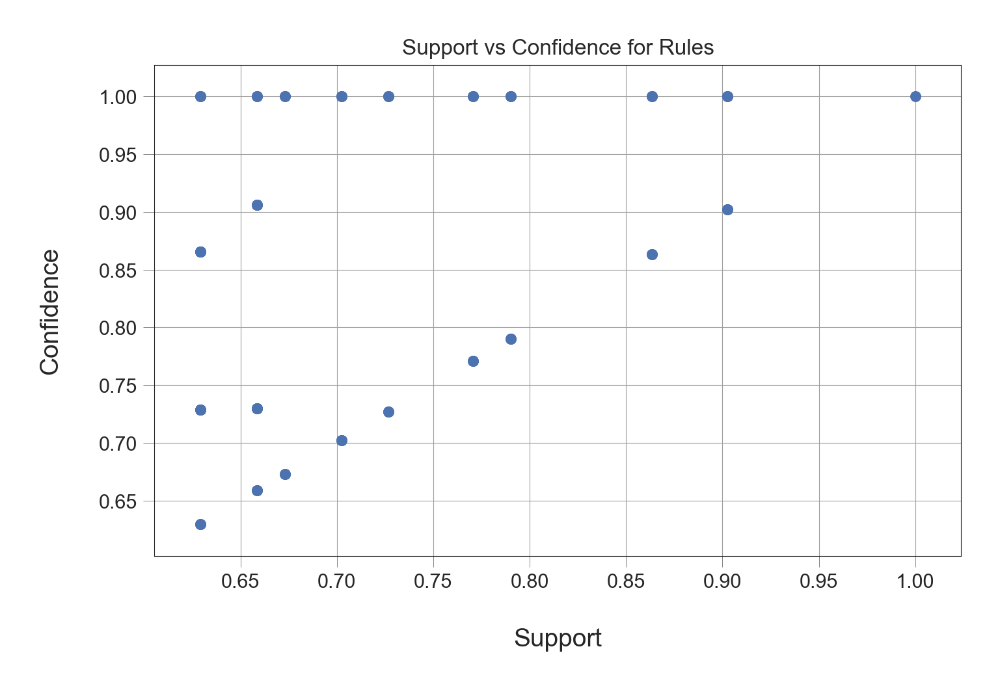

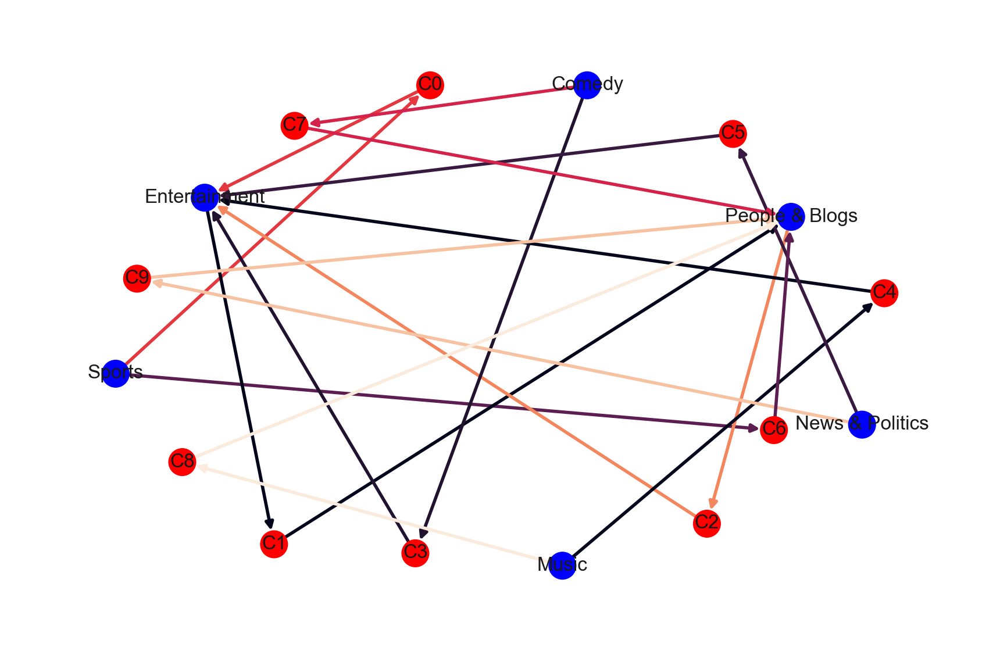

## **GB**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(Music),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(Music),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


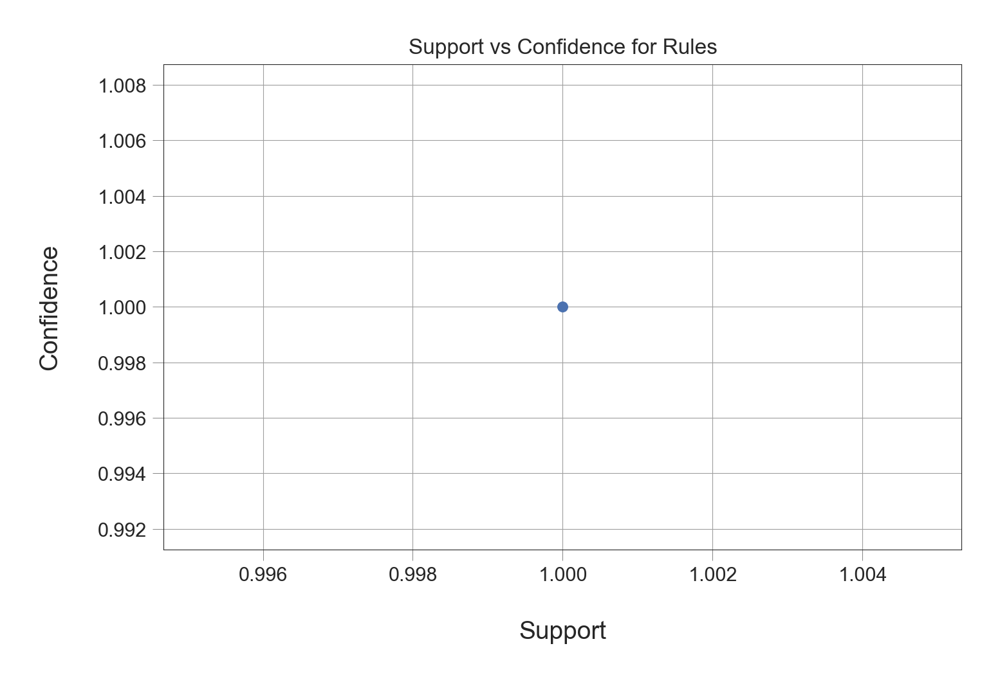

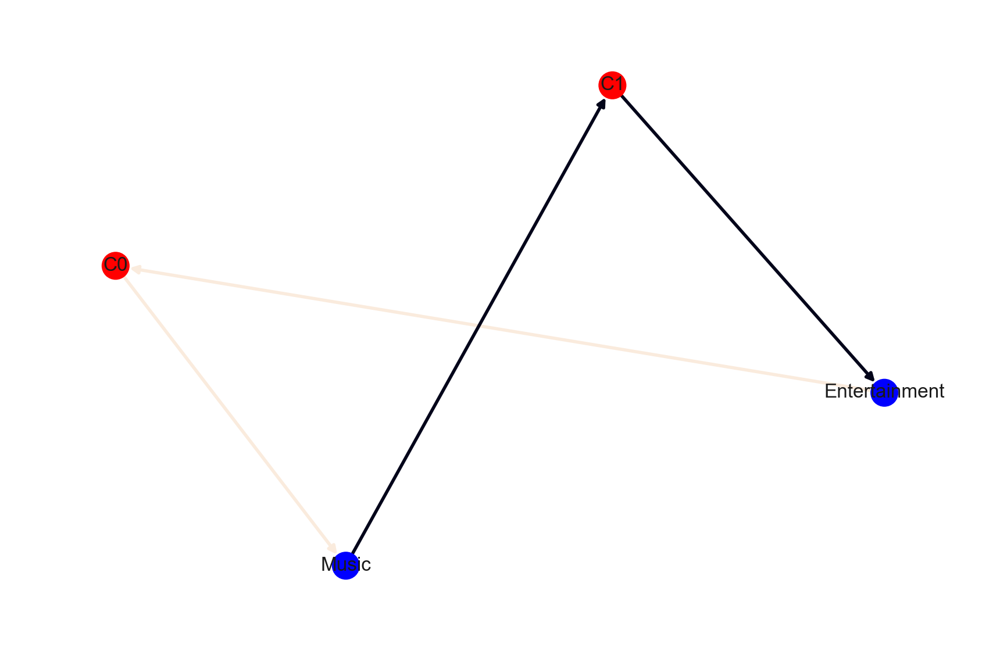

## **IN**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1,(News & Politics),(Entertainment),0.87,1.00,0.87,1.00,1.00,0.00,inf
3,(Music),(Entertainment),0.69,1.00,0.69,1.00,1.00,0.00,inf
0,(Entertainment),(News & Politics),1.00,0.87,0.87,0.87,1.00,0.00,1.00
2,(Entertainment),(Music),1.00,0.69,0.69,0.69,1.00,0.00,1.00


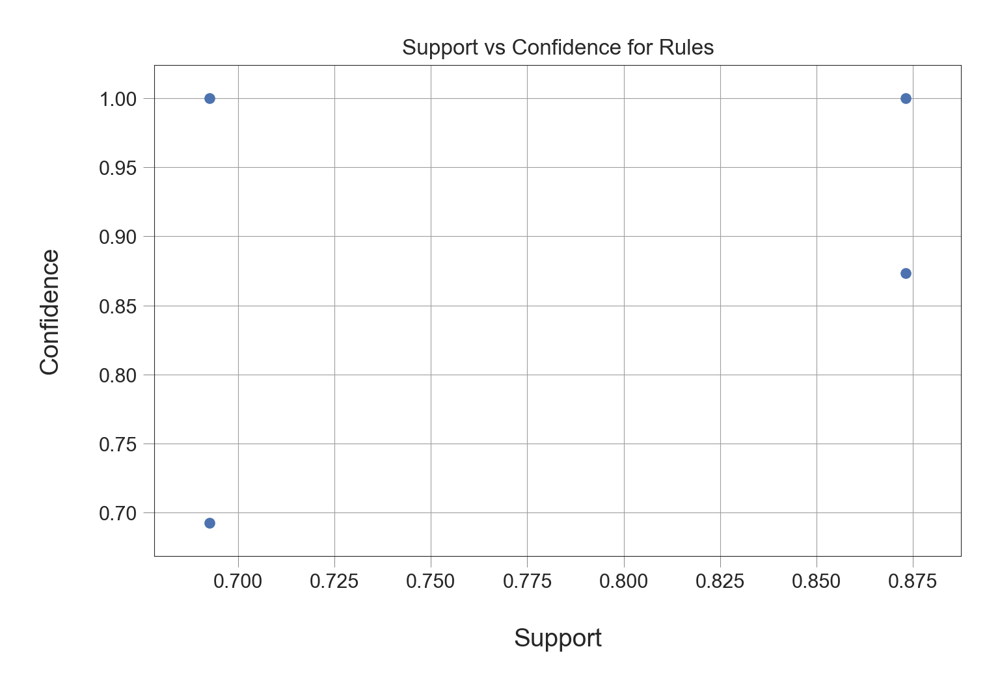

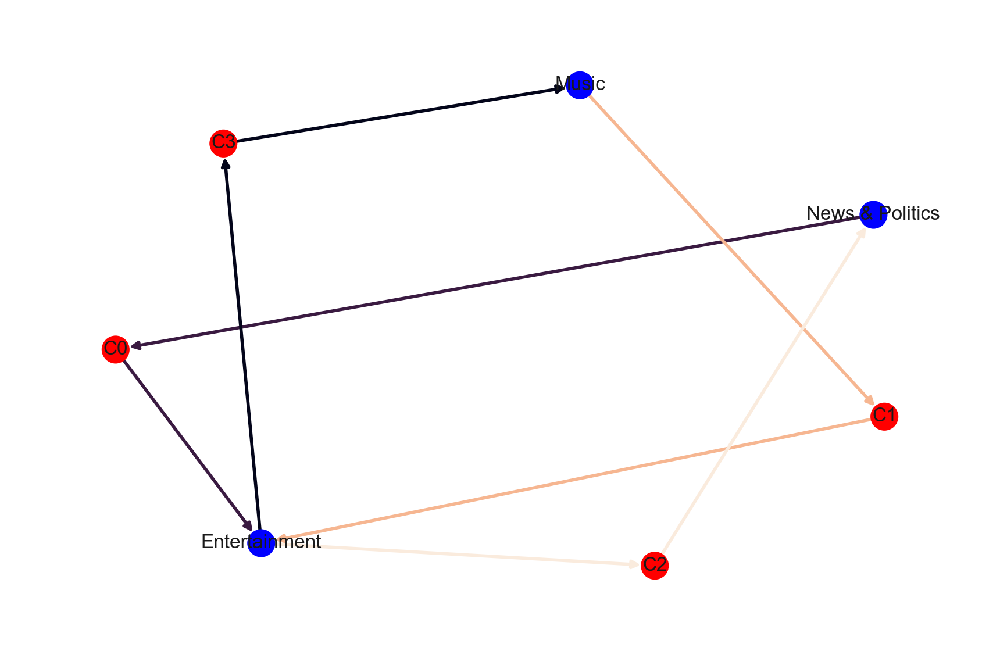

## **US**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(Music),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(Music),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
2,(Howto & Style),(Entertainment),0.93,1.00,0.93,1.00,1.00,0.00,inf
5,(Comedy),(Entertainment),0.80,1.00,0.80,1.00,1.00,0.00,inf
6,(Howto & Style),(Music),0.93,1.00,0.93,1.00,1.00,0.00,inf
8,(Comedy),(Music),0.80,1.00,0.80,1.00,1.00,0.00,inf
12,"(Howto & Style, Entertainment)",(Music),0.93,1.00,0.93,1.00,1.00,0.00,inf
13,"(Howto & Style, Music)",(Entertainment),0.93,1.00,0.93,1.00,1.00,0.00,inf
15,(Howto & Style),"(Entertainment, Music)",0.93,1.00,0.93,1.00,1.00,0.00,inf
18,"(Entertainment, Comedy)",(Music),0.80,1.00,0.80,1.00,1.00,0.00,inf


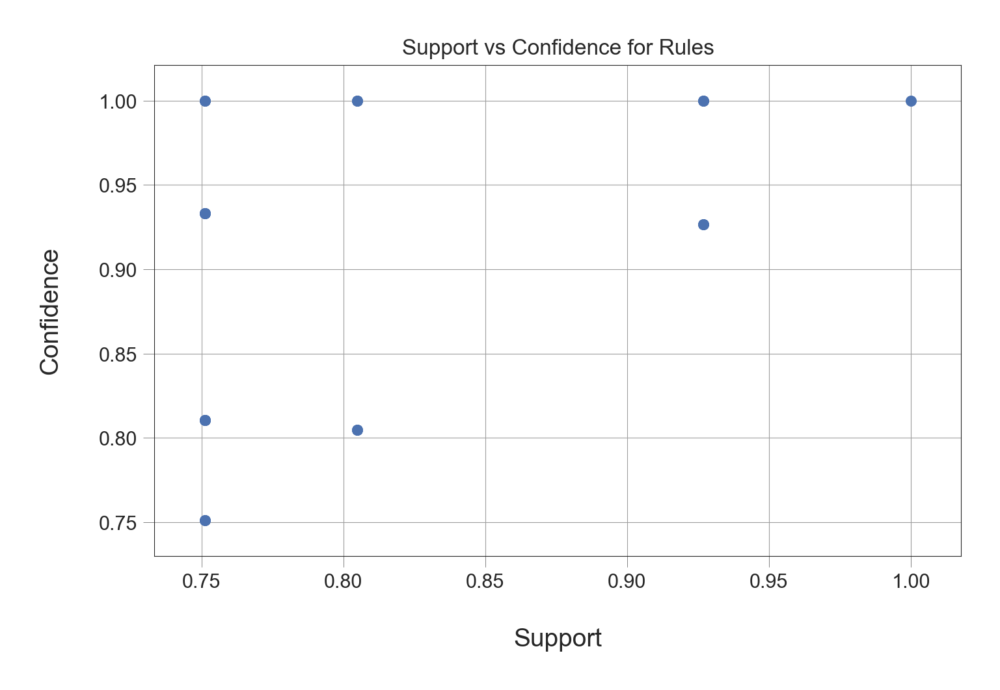

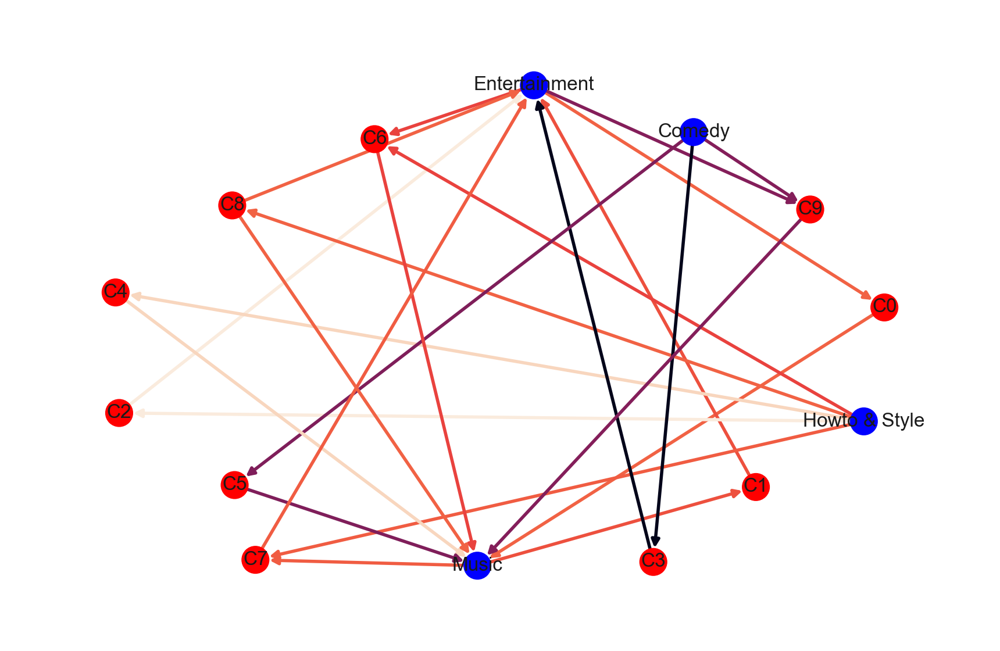

## **MX**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
3,(Sports),(Entertainment),0.63,1.00,0.63,1.00,1.00,0.00,inf
5,(Sports),(People & Blogs),0.63,1.00,0.63,1.00,1.00,0.00,inf
6,"(Entertainment, Sports)",(People & Blogs),0.63,1.00,0.63,1.00,1.00,0.00,inf
7,"(People & Blogs, Sports)",(Entertainment),0.63,1.00,0.63,1.00,1.00,0.00,inf
9,(Sports),"(Entertainment, People & Blogs)",0.63,1.00,0.63,1.00,1.00,0.00,inf
2,(Entertainment),(Sports),1.00,0.63,0.63,0.63,1.00,0.00,1.00
4,(People & Blogs),(Sports),1.00,0.63,0.63,0.63,1.00,0.00,1.00
8,"(Entertainment, People & Blogs)",(Sports),1.00,0.63,0.63,0.63,1.00,0.00,1.00


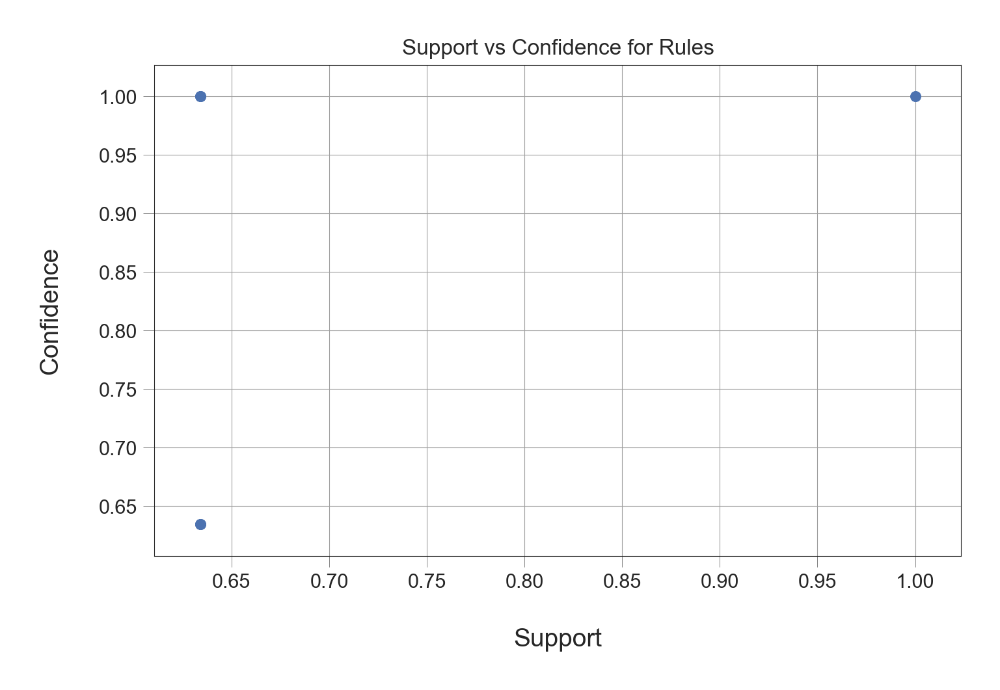

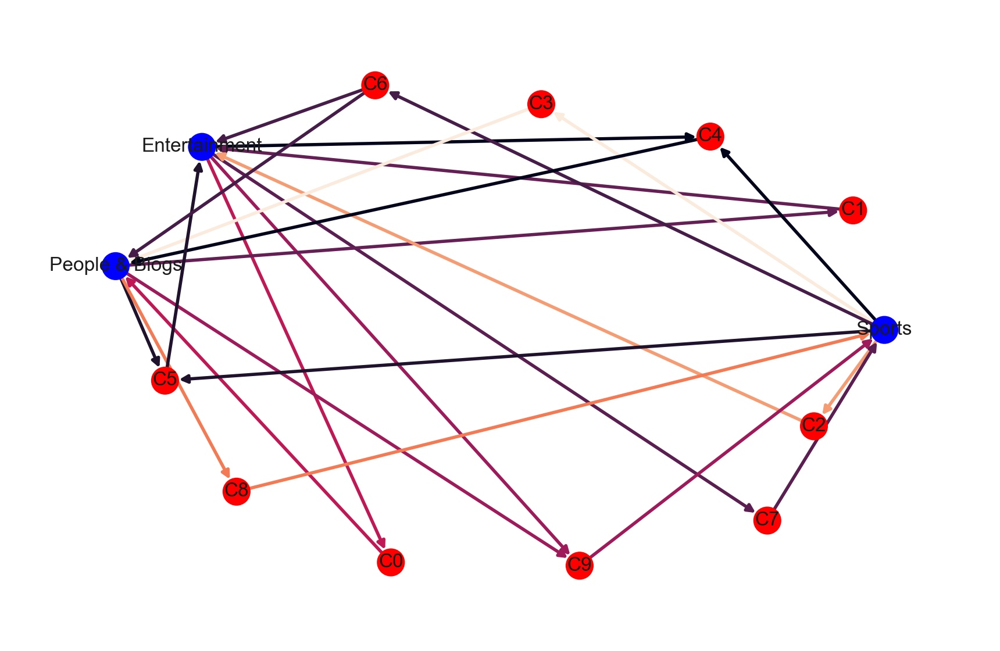

## **JP**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1,(People & Blogs),(Entertainment),0.95,1.00,0.95,1.00,1.00,0.00,inf
3,(Sports),(Entertainment),0.66,1.00,0.66,1.00,1.00,0.00,inf
7,"(People & Blogs, Sports)",(Entertainment),0.63,1.00,0.63,1.00,1.00,0.00,inf
5,(Sports),(People & Blogs),0.66,0.95,0.63,0.96,1.01,0.01,1.31
6,"(Entertainment, Sports)",(People & Blogs),0.66,0.95,0.63,0.96,1.01,0.01,1.31
9,(Sports),"(Entertainment, People & Blogs)",0.66,0.95,0.63,0.96,1.01,0.01,1.31
0,(Entertainment),(People & Blogs),1.00,0.95,0.95,0.95,1.00,0.00,1.00
4,(People & Blogs),(Sports),0.95,0.66,0.63,0.66,1.01,0.01,1.02
8,"(Entertainment, People & Blogs)",(Sports),0.95,0.66,0.63,0.66,1.01,0.01,1.02
11,(People & Blogs),"(Entertainment, Sports)",0.95,0.66,0.63,0.66,1.01,0.01,1.02


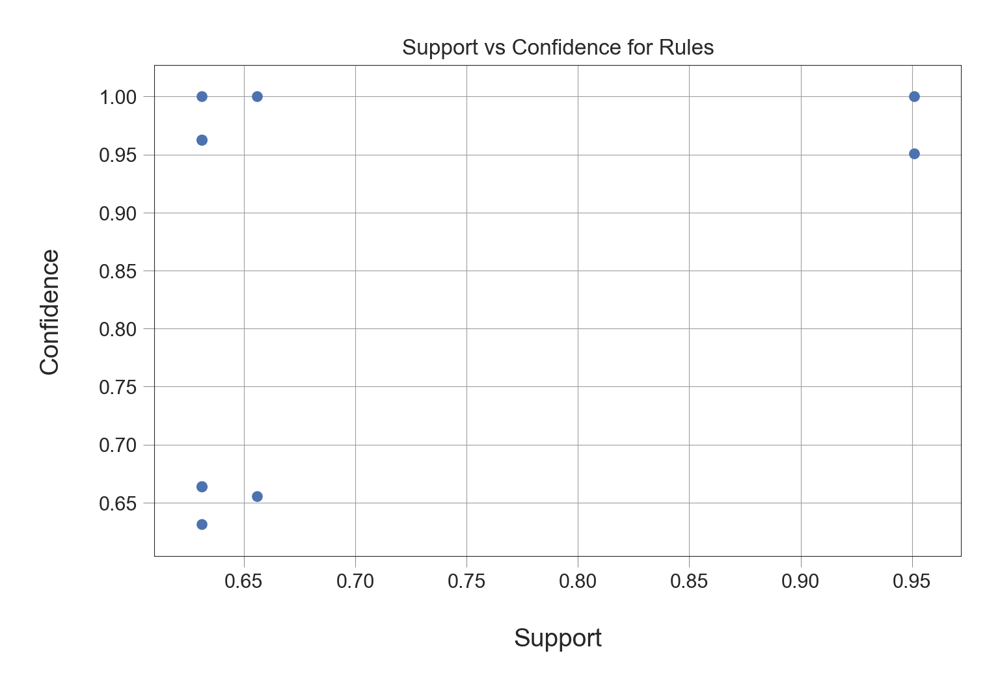

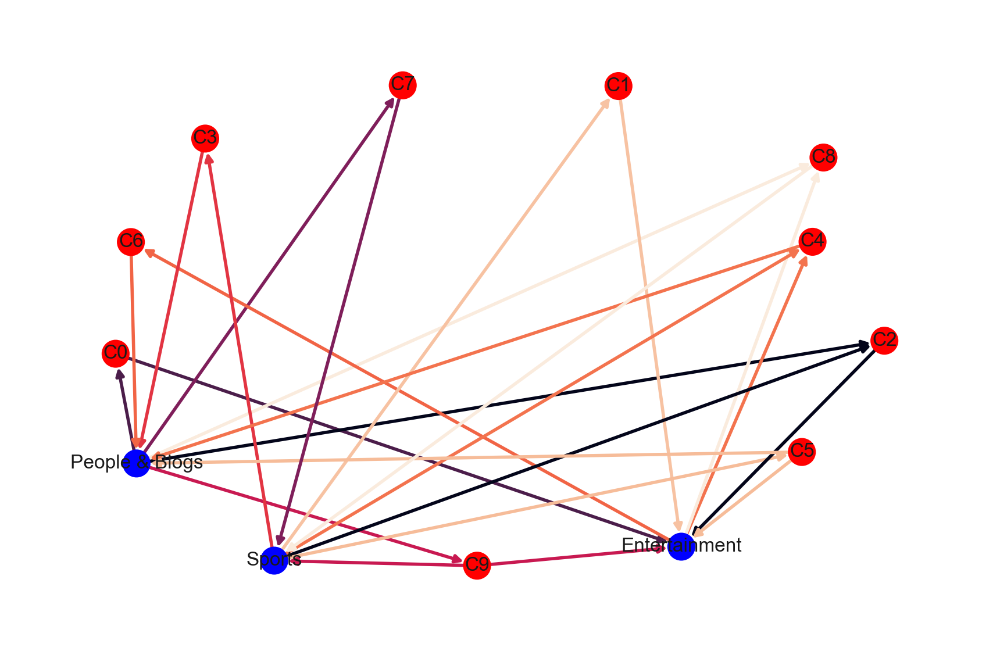

## **KR**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(People & Blogs),(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(News & Politics),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
2,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
3,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
4,(Entertainment),(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
5,(News & Politics),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
6,"(People & Blogs, News & Politics)",(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
7,"(People & Blogs, Entertainment)",(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
8,"(Entertainment, News & Politics)",(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
9,(People & Blogs),"(Entertainment, News & Politics)",1.00,1.00,1.00,1.00,1.00,0.00,inf


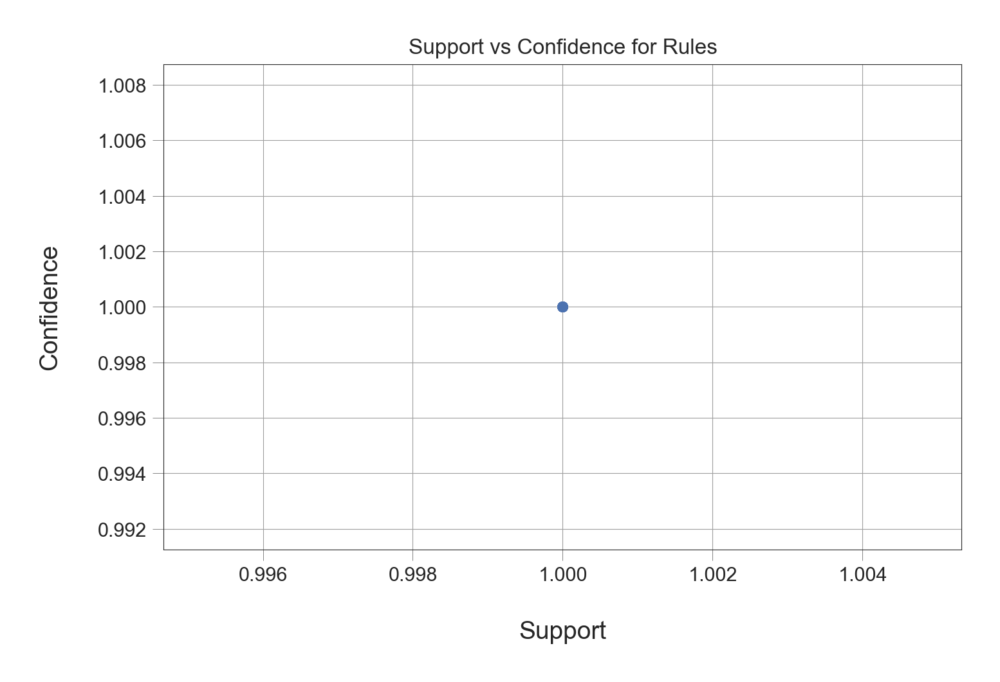

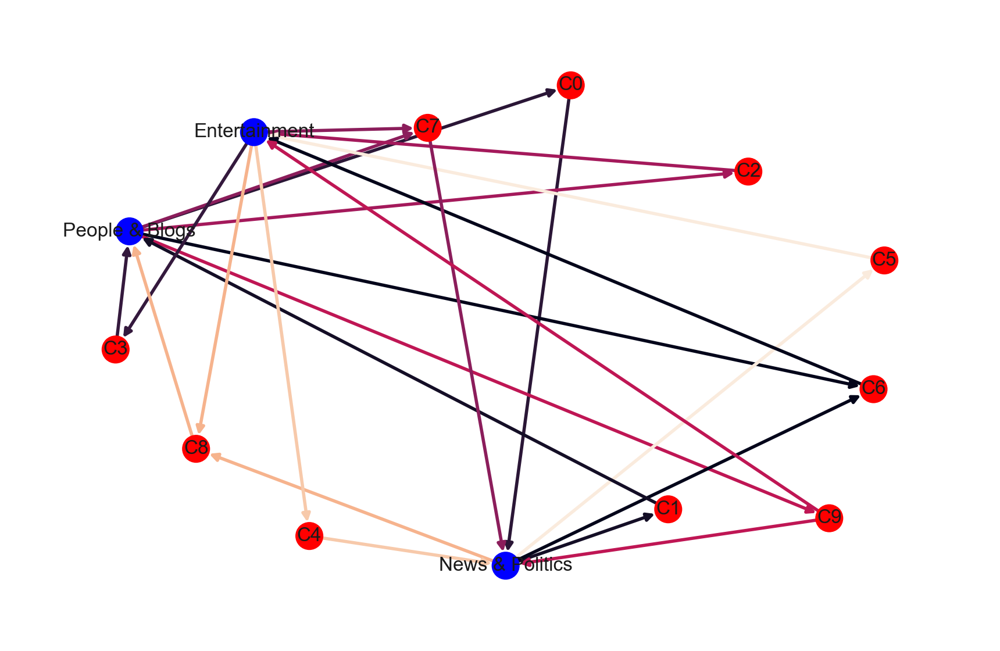

21.2354519367218


In [6]:
start = time.time()
for i in datasets:
    rules, no_of_rules= apriori_model(i)
    linkage(rules,no_of_rules )  
runtime = (time.time() - start)
print(runtime)

# Model B: Eclat Model

In [7]:
def eclat(dataset_name):
    dataset, df = mainfunc(dataset_name)
    trans = TransactionEncoder()
    Transformed_array = trans.fit(dataset).transform(dataset)
    dataframe_transformed = pd.DataFrame(Transformed_array, columns = trans.columns_)
    frq_items = apriori(dataframe_transformed, min_support=0.6, use_colnames=True)
    rules = association_rules(frq_items, metric ="support", min_threshold = 0.7)
    rules = pd.DataFrame(rules)
    rules1 = rules.sort_values(by='support', ascending = False)
    no_of_rules = len(rules1)
    if no_of_rules>=10:
        count = 10
    else:
        count = no_of_rules
    display(rules1)
    x = list(rules1['support'])
    y = list(rules1['confidence'])
    plt.scatter(x, y)
    plt.title('Support vs Confidence for Rules')
    plt.xlabel('Support')
    plt.ylabel('Confidence')
    plt.show()
    return rules1, count

## **CA**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
10,(Entertainment),(People & Blogs),1.00,0.89,0.89,0.89,1.00,0.00,1.00
11,(People & Blogs),(Entertainment),0.89,1.00,0.89,1.00,1.00,0.00,inf
0,(Entertainment),(Comedy),1.00,0.86,0.86,0.86,1.00,0.00,1.00
8,(Entertainment),(News & Politics),1.00,0.86,0.86,0.86,1.00,0.00,1.00
9,(News & Politics),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
1,(Comedy),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
6,(Entertainment),(Music),1.00,0.79,0.79,0.79,1.00,0.00,1.00
7,(Music),(Entertainment),0.79,1.00,0.79,1.00,1.00,0.00,inf
15,(News & Politics),(People & Blogs),0.86,0.89,0.78,0.90,1.01,0.00,1.06
38,(News & Politics),"(Entertainment, People & Blogs)",0.86,0.89,0.78,0.90,1.01,0.00,1.06


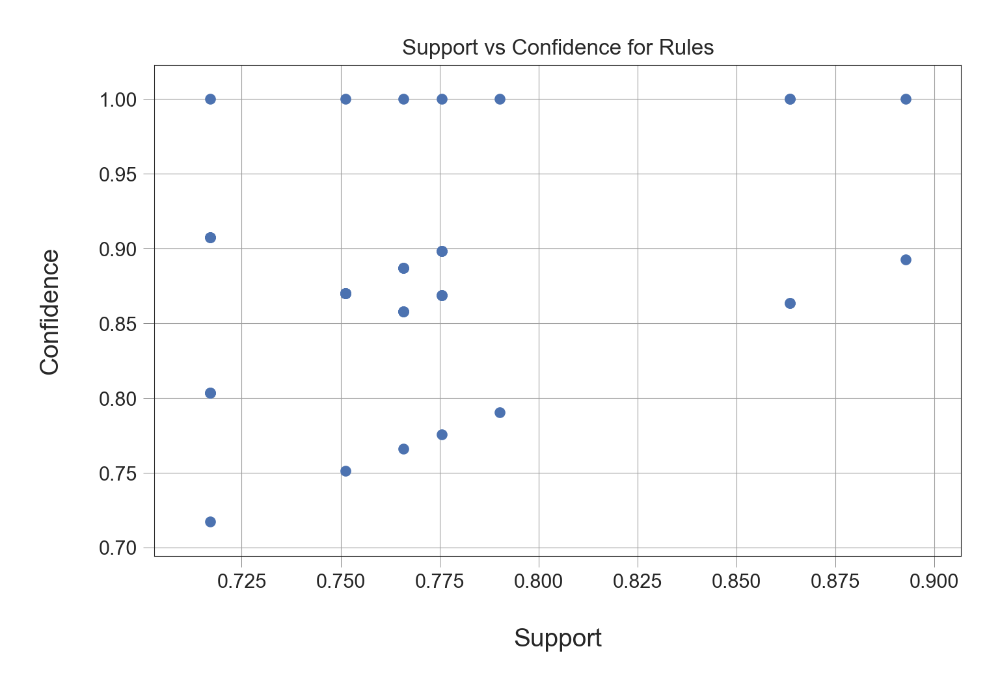

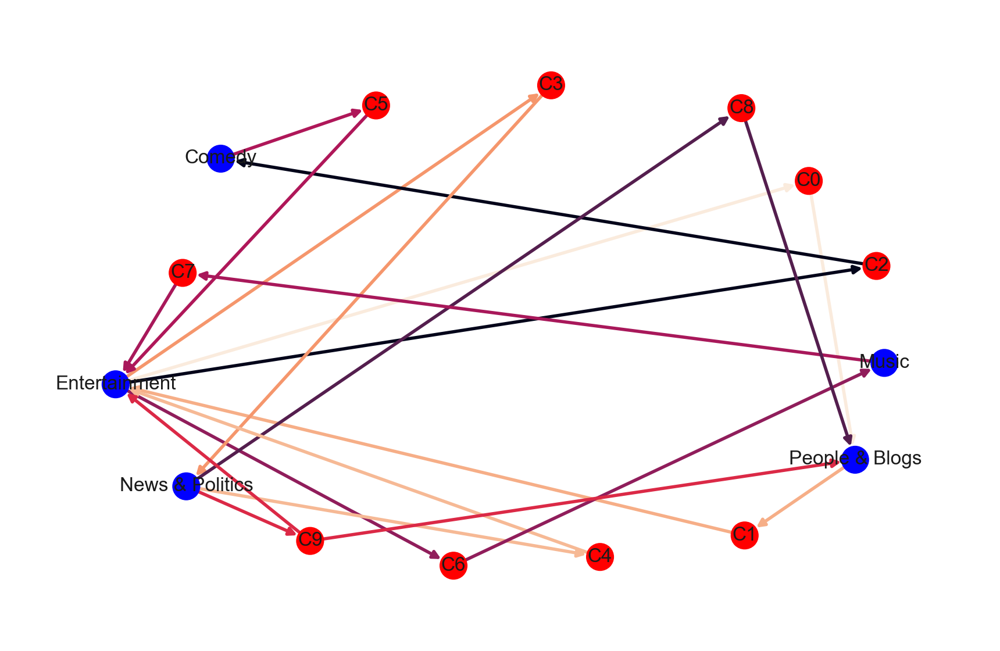

## **DE**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


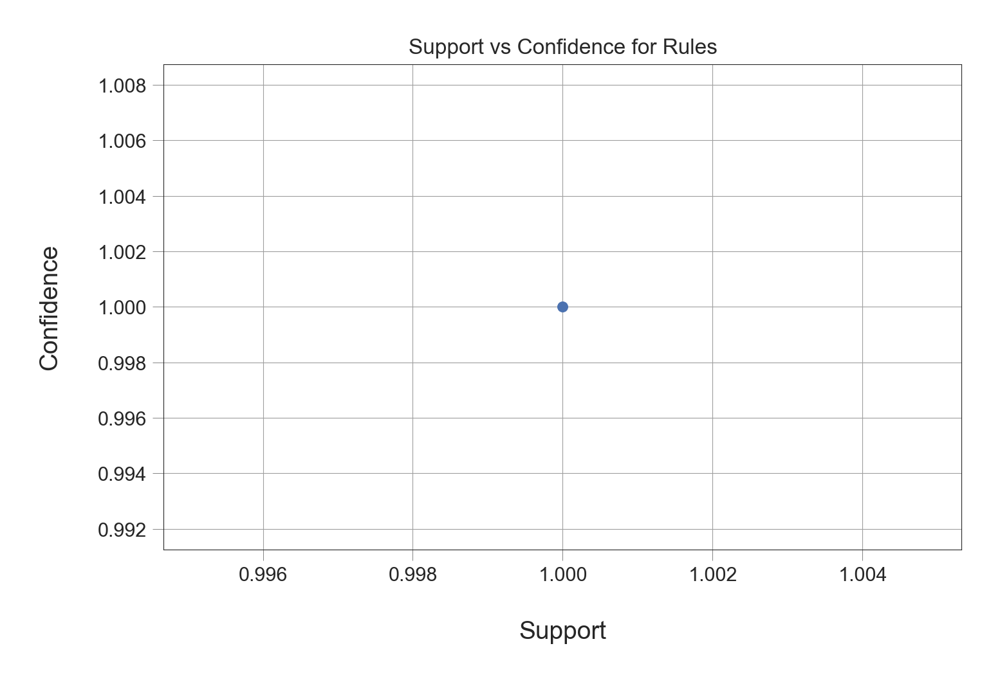

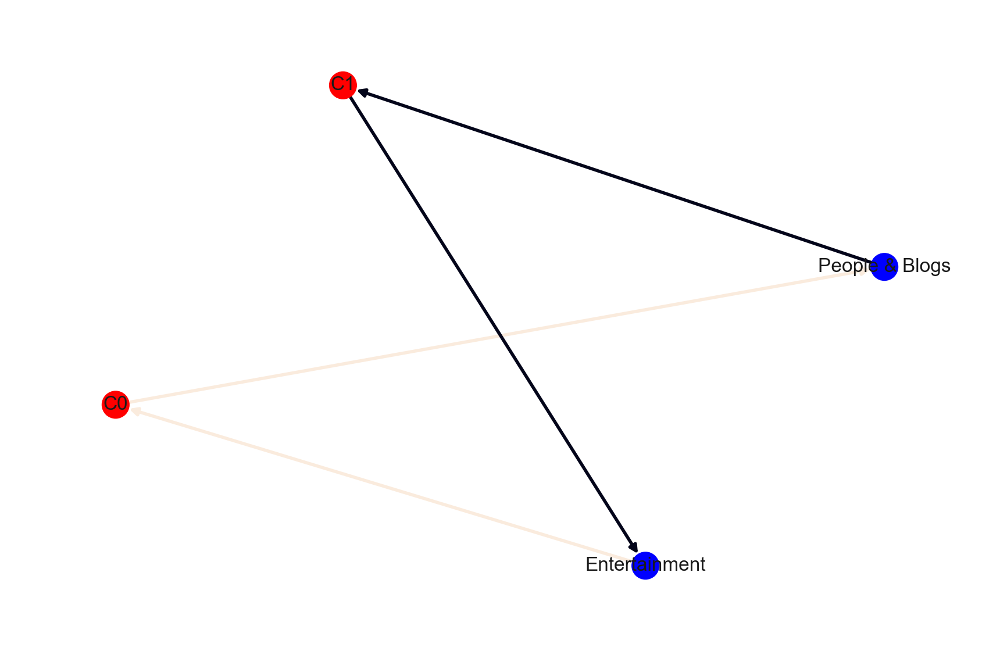

## **FR**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
12,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
13,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
0,(Entertainment),(Comedy),1.00,0.90,0.90,0.90,1.00,0.00,1.00
33,(People & Blogs),"(Entertainment, Comedy)",1.00,0.90,0.90,0.90,1.00,0.00,1.00
32,(Comedy),"(Entertainment, People & Blogs)",0.90,1.00,0.90,1.00,1.00,0.00,inf
...,...,...,...,...,...,...,...,...,...
27,(Music),"(Entertainment, Comedy)",0.79,0.90,0.70,0.89,0.98,-0.01,0.88
42,"(Comedy, Music)",(People & Blogs),0.70,1.00,0.70,1.00,1.00,0.00,inf
41,"(People & Blogs, Music)",(Comedy),0.79,0.90,0.70,0.89,0.98,-0.01,0.88
40,"(People & Blogs, Comedy)",(Music),0.90,0.79,0.70,0.78,0.98,-0.01,0.95


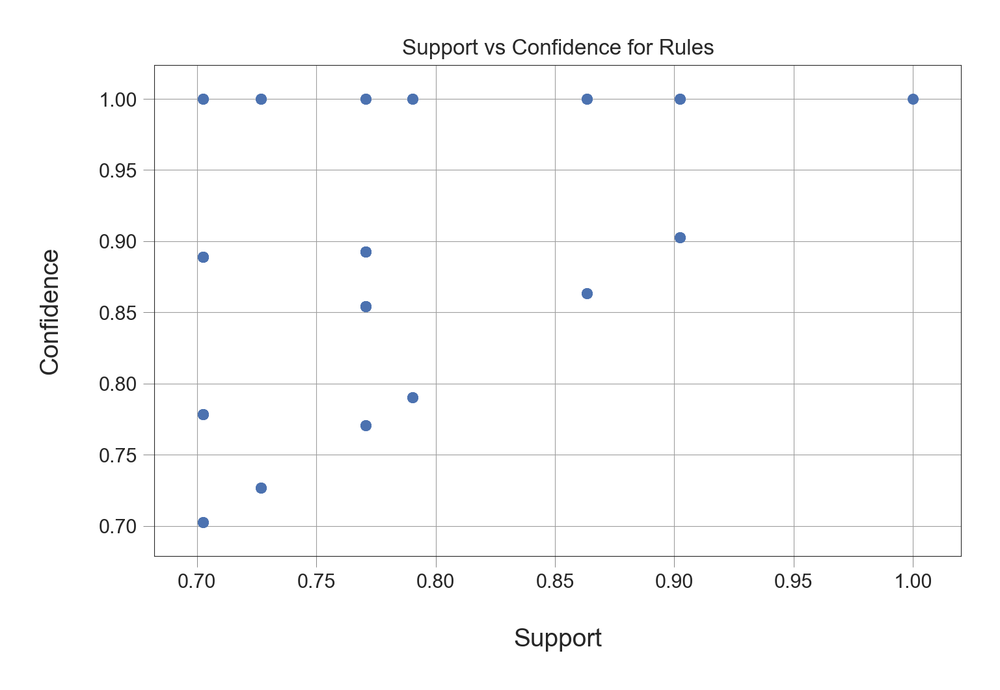

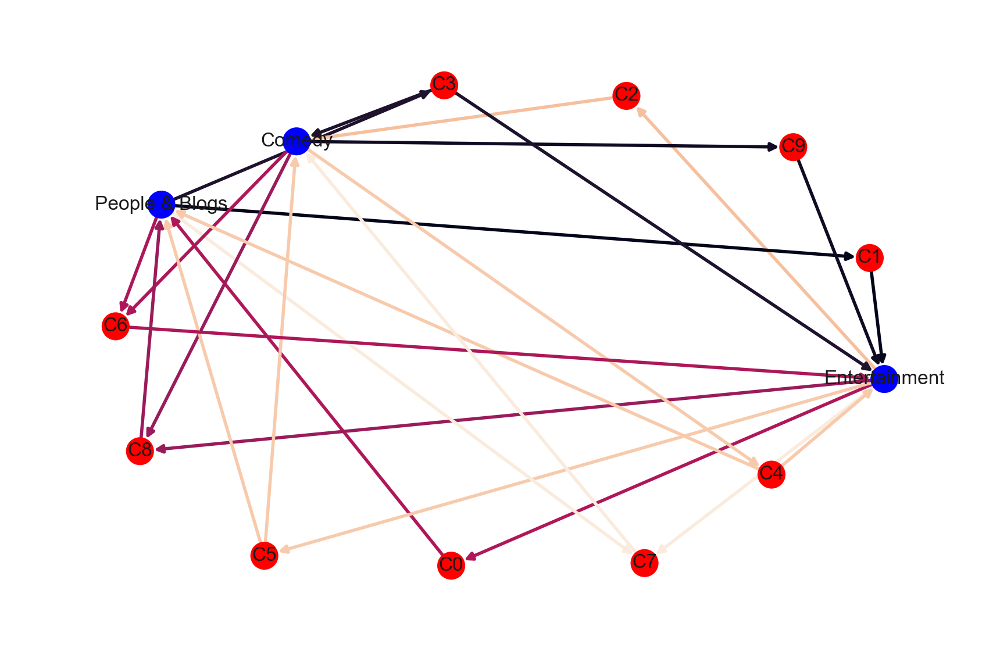

## **GB**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(Music),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(Music),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


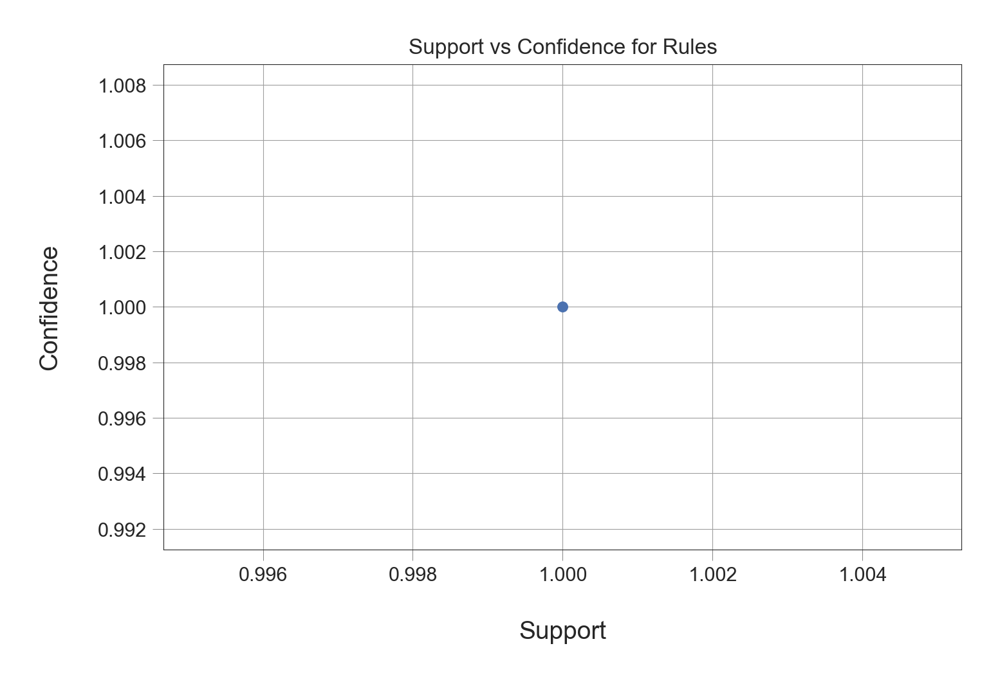

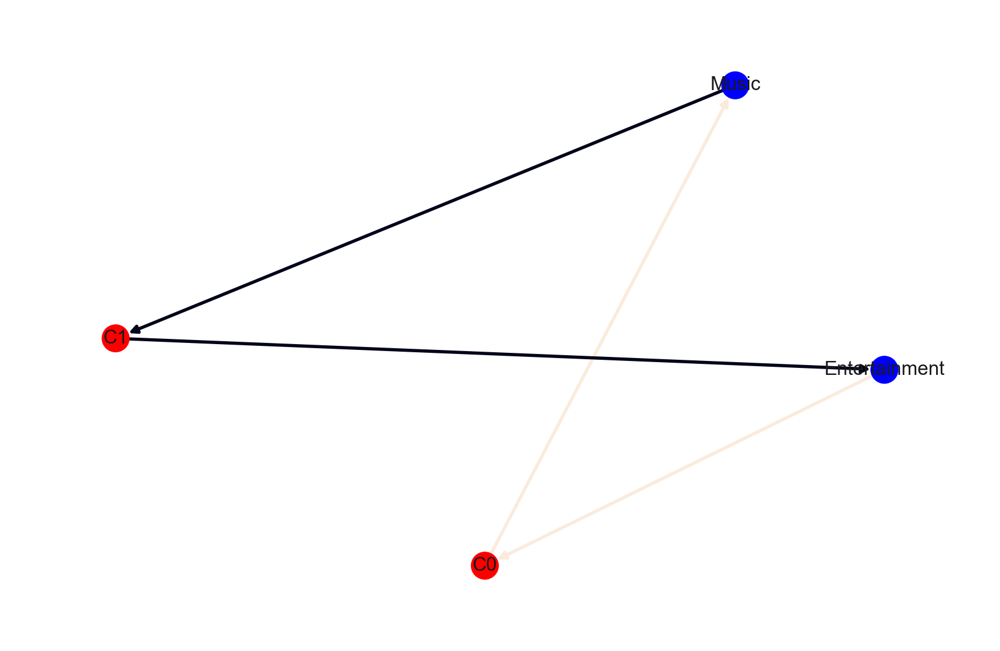

## **IN**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(News & Politics),1.00,0.87,0.87,0.87,1.00,0.00,1.00
1,(News & Politics),(Entertainment),0.87,1.00,0.87,1.00,1.00,0.00,inf


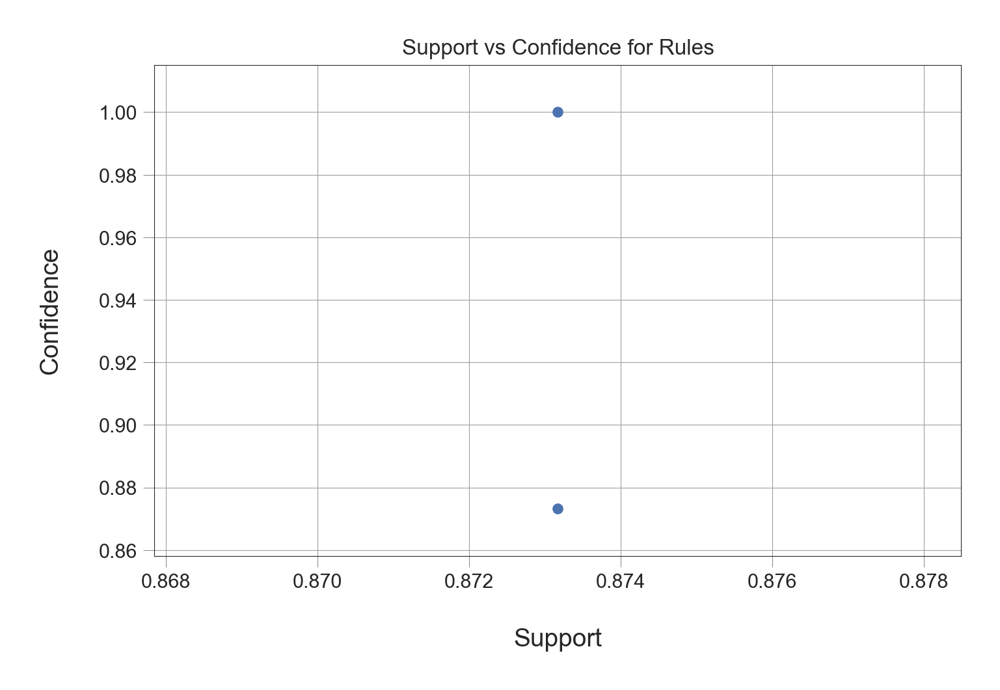

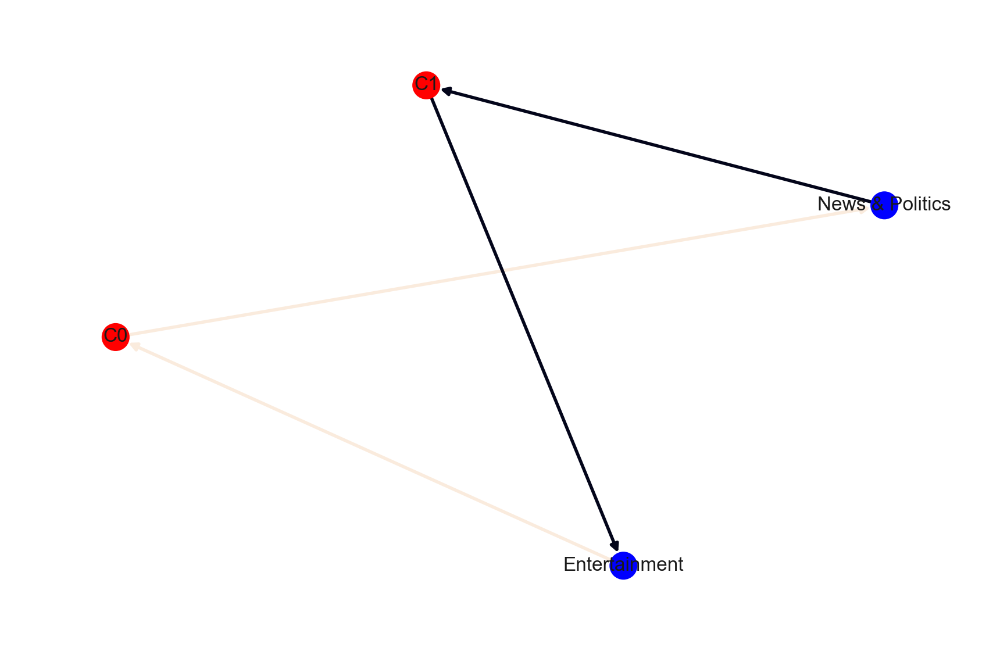

## **US**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
9,(Music),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
8,(Entertainment),(Music),1.00,1.00,1.00,1.00,1.00,0.00,inf
6,(Howto & Style),(Entertainment),0.93,1.00,0.93,1.00,1.00,0.00,inf
11,(Music),(Howto & Style),1.00,0.93,0.93,0.93,1.00,0.00,1.00
10,(Howto & Style),(Music),0.93,1.00,0.93,1.00,1.00,0.00,inf
7,(Entertainment),(Howto & Style),1.00,0.93,0.93,0.93,1.00,0.00,1.00
34,(Entertainment),"(Howto & Style, Music)",1.00,0.93,0.93,0.93,1.00,0.00,1.00
30,"(Howto & Style, Entertainment)",(Music),0.93,1.00,0.93,1.00,1.00,0.00,inf
31,"(Howto & Style, Music)",(Entertainment),0.93,1.00,0.93,1.00,1.00,0.00,inf
32,"(Entertainment, Music)",(Howto & Style),1.00,0.93,0.93,0.93,1.00,0.00,1.00


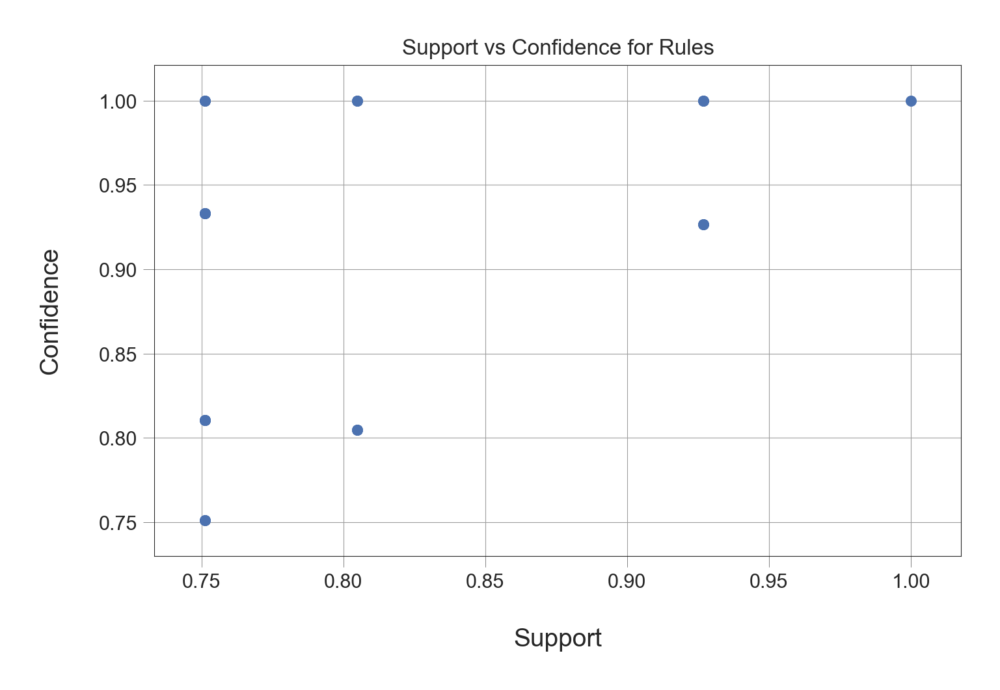

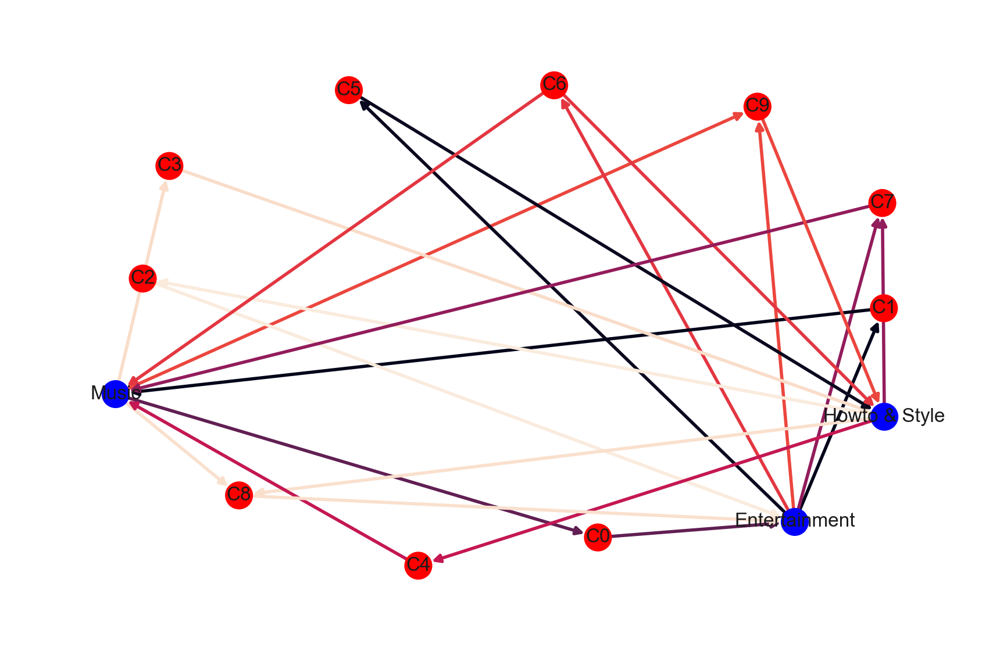

## **MX**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


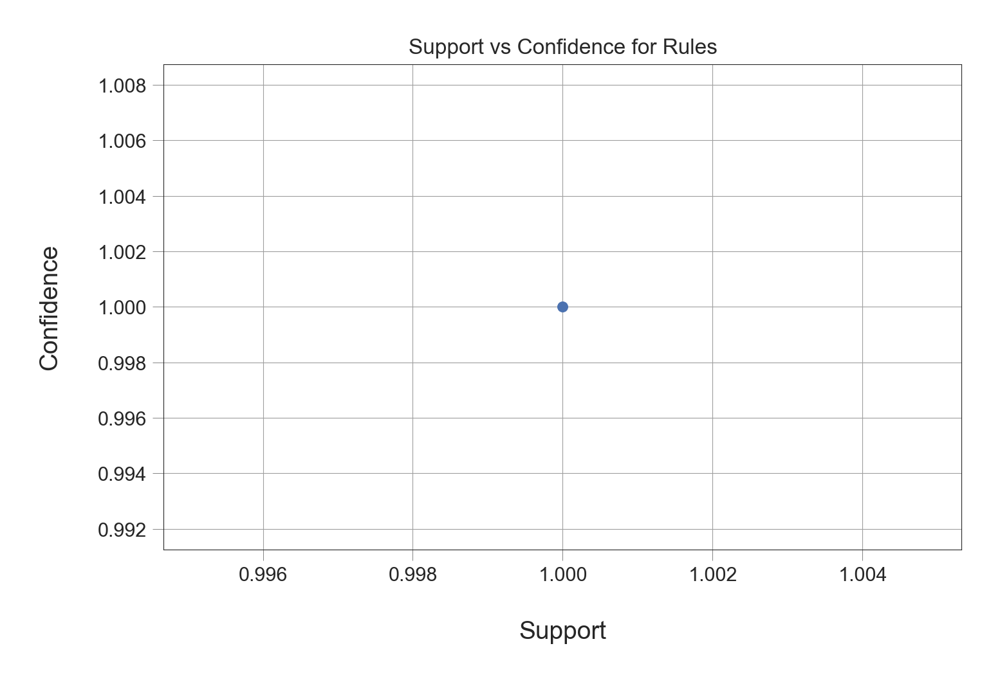

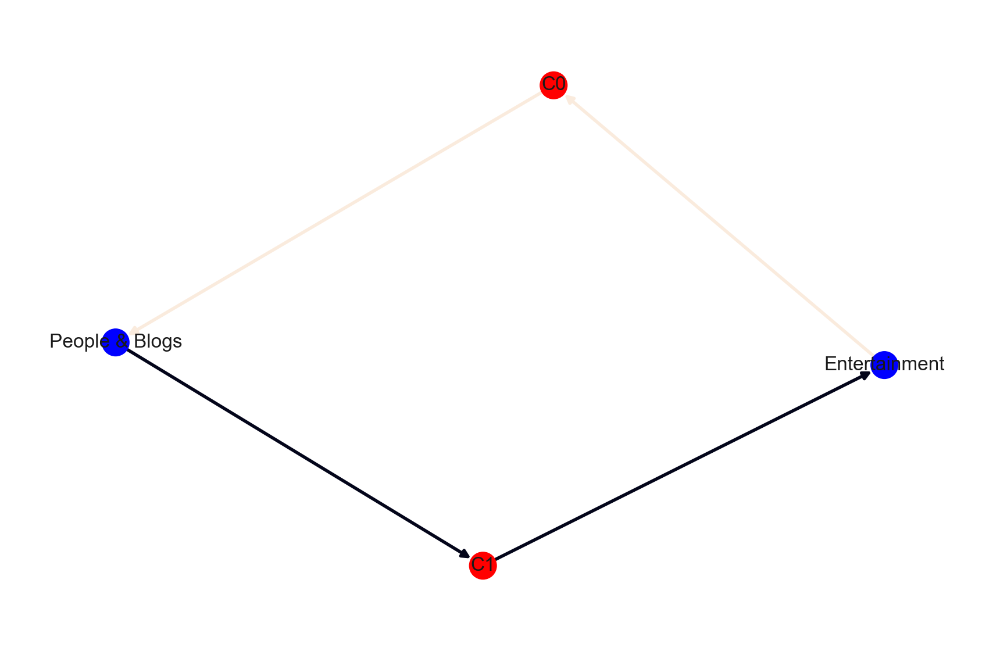

## **JP**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,0.95,0.95,0.95,1.00,0.00,1.00
1,(People & Blogs),(Entertainment),0.95,1.00,0.95,1.00,1.00,0.00,inf


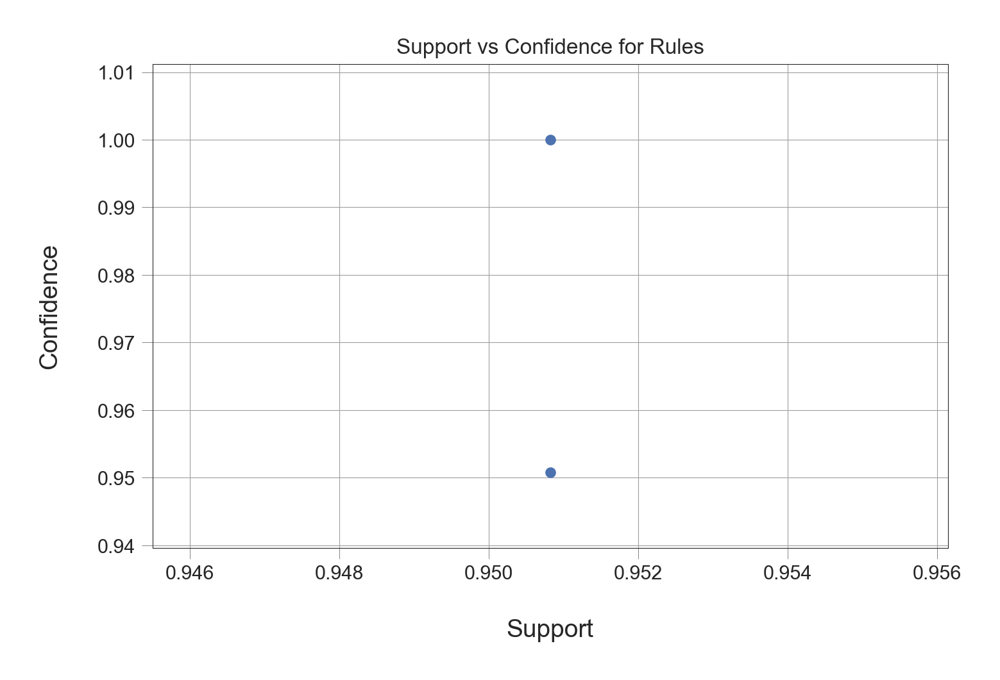

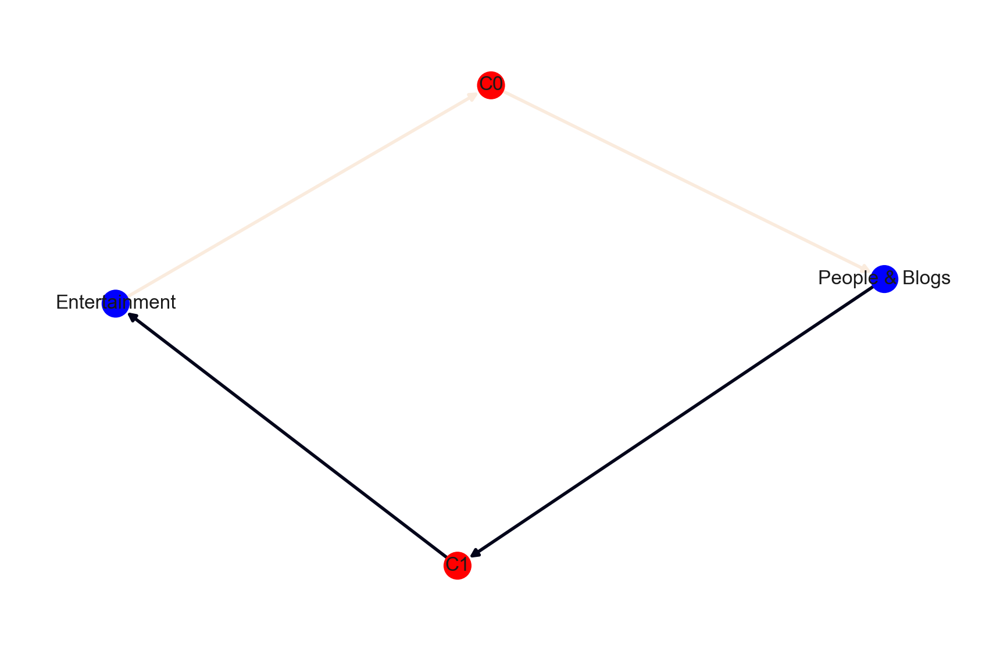

## **KR**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(News & Politics),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
2,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
3,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
4,(People & Blogs),(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
5,(News & Politics),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
6,"(Entertainment, News & Politics)",(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
7,"(Entertainment, People & Blogs)",(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
8,"(People & Blogs, News & Politics)",(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
9,(Entertainment),"(People & Blogs, News & Politics)",1.00,1.00,1.00,1.00,1.00,0.00,inf


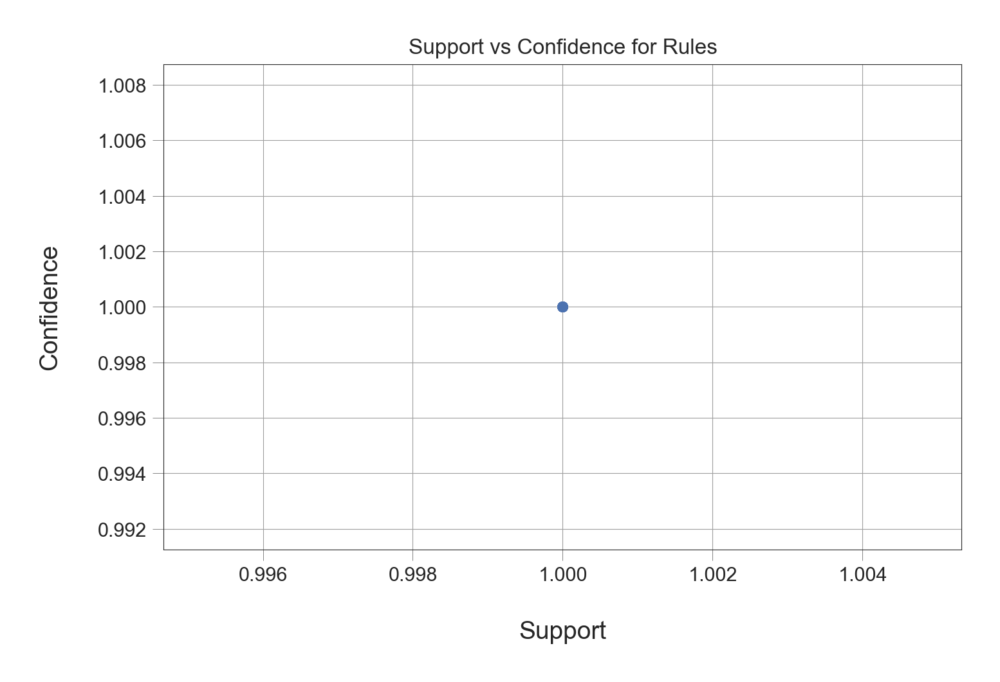

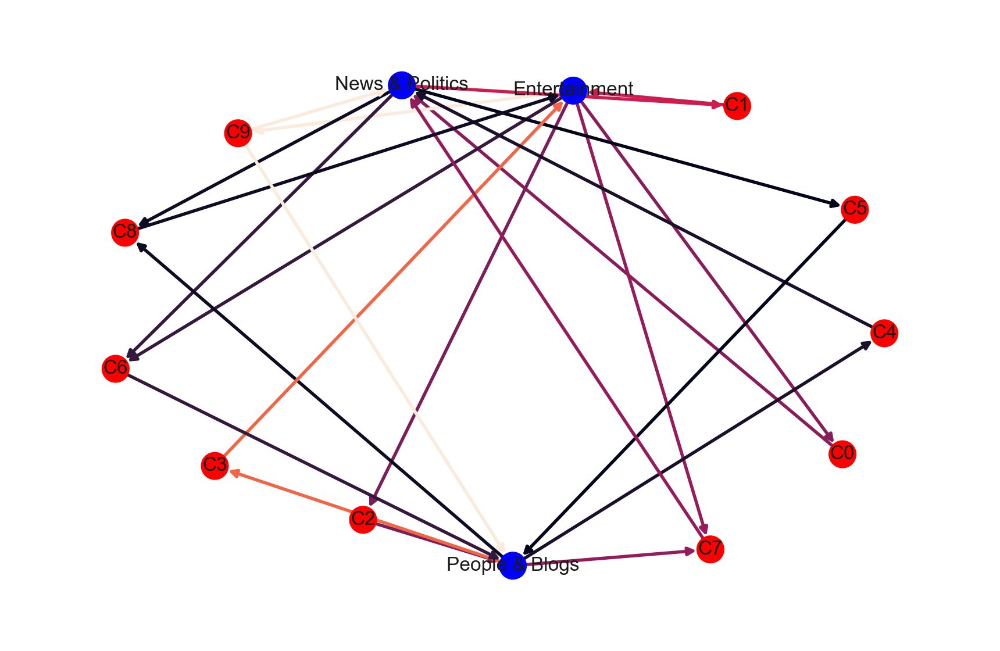

24.74760389328003


In [8]:
start = time.time()
for i in datasets:
    rules, no_of_rules = eclat(i)
    linkage(rules,no_of_rules) 
runtime = (time.time() - start)
print(runtime)

# Model C: FpGrowth

In [9]:
def fpGrowth1(dataset_name):
    dataset, df = mainfunc(dataset_name)
    te = TransactionEncoder()
    te_ary = te.fit(dataset).transform(dataset)
    data = pd.DataFrame(te_ary, columns=te.columns_)
    patterns = fpgrowth(data,0.6, use_colnames=True)
    rules = association_rules(patterns, metric ="support", min_threshold = 0.7)
    rules = pd.DataFrame(rules)
    rules1 = rules.sort_values(by='support', ascending = False)
    no_of_rules = len(rules1)
    if no_of_rules>=10:
        count = 10
    else:
        count = no_of_rules
    display(rules1)
    x = list(rules1['support'])
    y = list(rules1['confidence'])
    plt.scatter(x, y)
    plt.title('Support vs Confidence for Rules')
    plt.xlabel('Support')
    plt.ylabel('Confidence')
    plt.show()
    return rules1, count

## **CA**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,0.89,0.89,0.89,1.00,0.00,1.00
1,(People & Blogs),(Entertainment),0.89,1.00,0.89,1.00,1.00,0.00,inf
2,(Entertainment),(News & Politics),1.00,0.86,0.86,0.86,1.00,0.00,1.00
3,(News & Politics),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
13,(Comedy),(Entertainment),0.86,1.00,0.86,1.00,1.00,0.00,inf
12,(Entertainment),(Comedy),1.00,0.86,0.86,0.86,1.00,0.00,1.00
30,(Entertainment),(Music),1.00,0.79,0.79,0.79,1.00,0.00,1.00
31,(Music),(Entertainment),0.79,1.00,0.79,1.00,1.00,0.00,inf
10,(News & Politics),"(Entertainment, People & Blogs)",0.86,0.89,0.78,0.90,1.01,0.00,1.06
11,(People & Blogs),"(Entertainment, News & Politics)",0.89,0.86,0.78,0.87,1.01,0.00,1.04


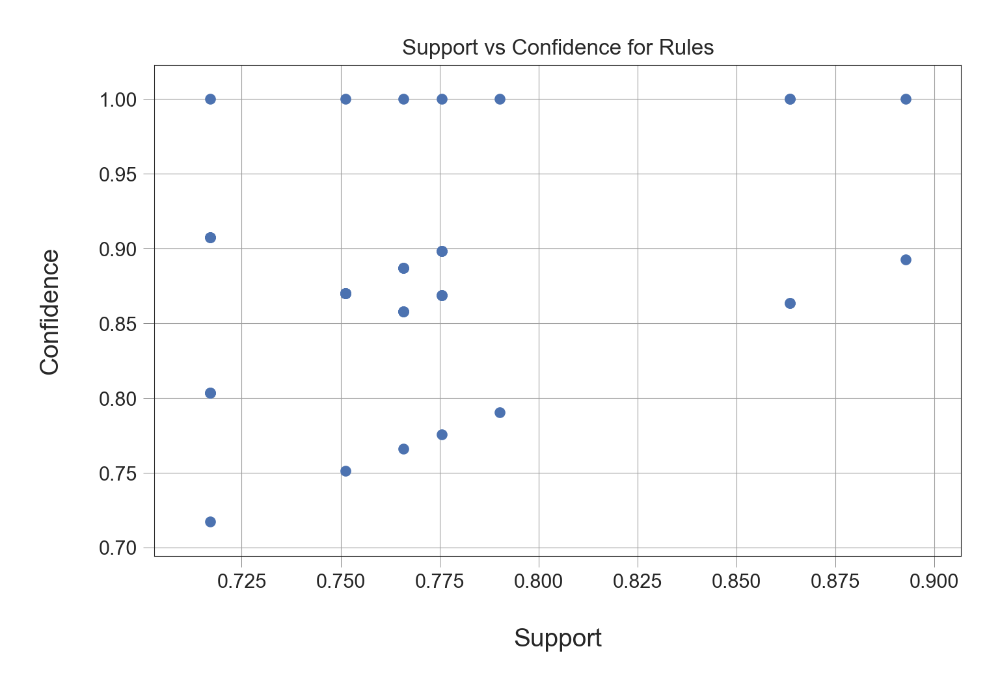

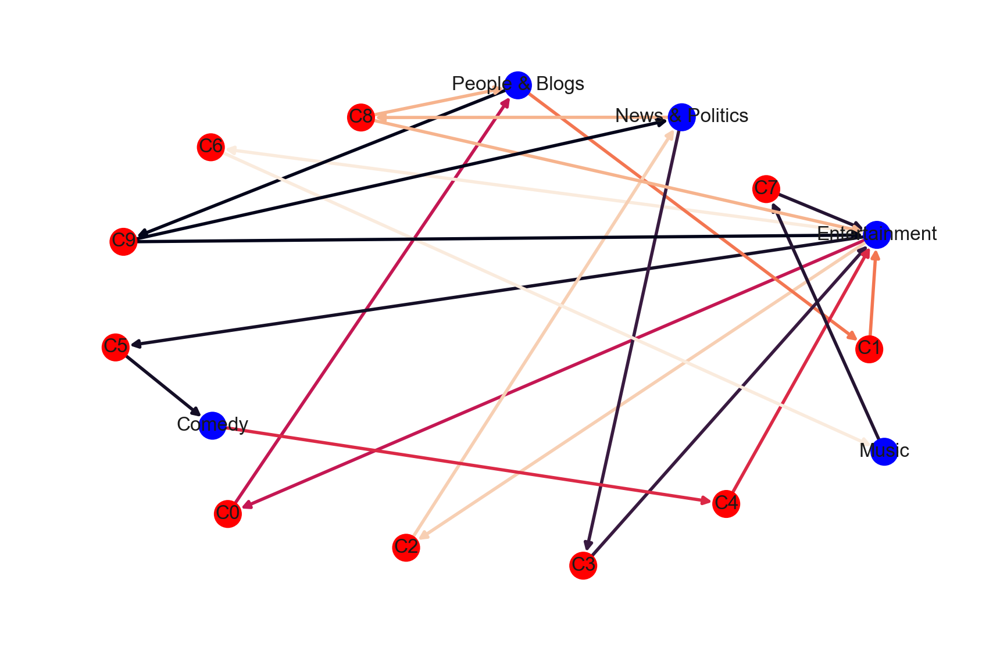

## **DE**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


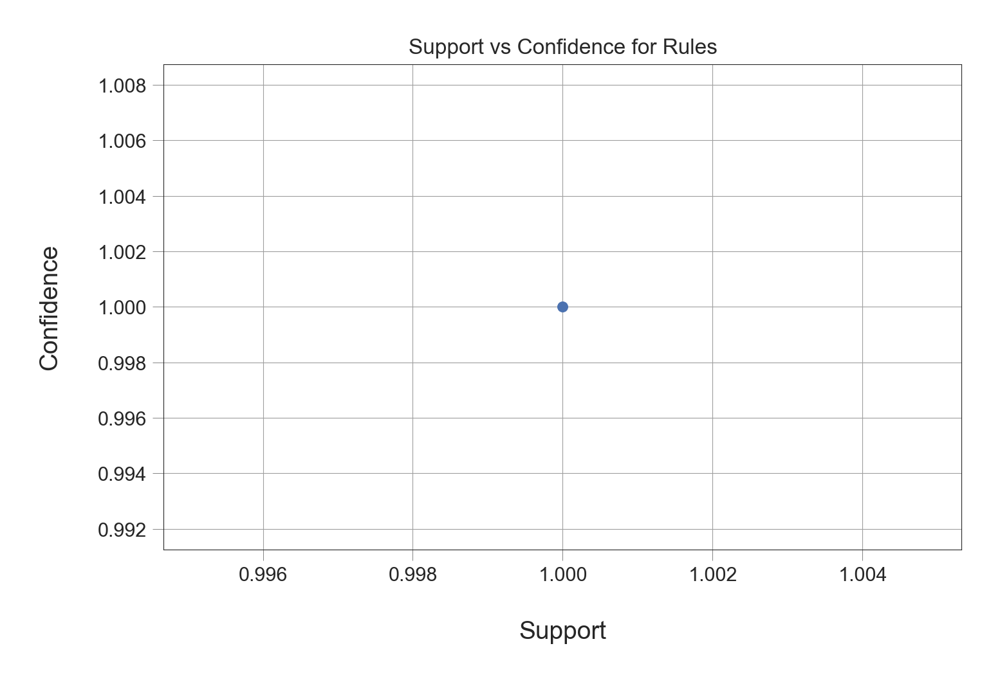

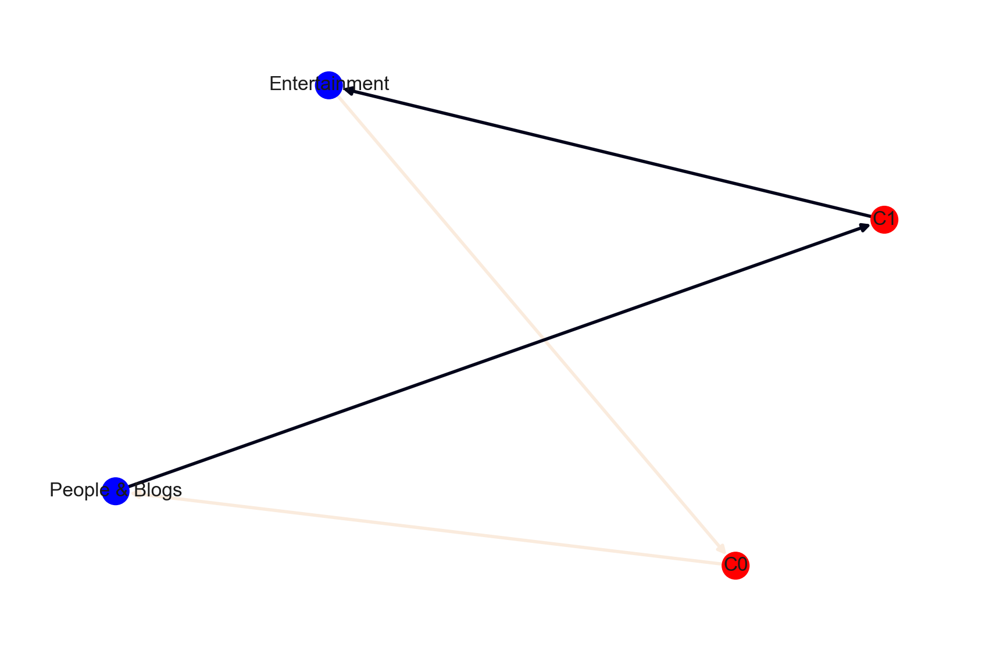

## **FR**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
7,"(Entertainment, People & Blogs)",(Comedy),1.00,0.90,0.90,0.90,1.00,0.00,1.00
11,(People & Blogs),"(Entertainment, Comedy)",1.00,0.90,0.90,0.90,1.00,0.00,1.00
10,(Comedy),"(Entertainment, People & Blogs)",0.90,1.00,0.90,1.00,1.00,0.00,inf
...,...,...,...,...,...,...,...,...,...
75,"(Entertainment, Comedy, Music)",(People & Blogs),0.70,1.00,0.70,1.00,1.00,0.00,inf
74,"(Entertainment, Comedy, People & Blogs)",(Music),0.90,0.79,0.70,0.78,0.98,-0.01,0.95
73,(Music),"(Entertainment, Comedy)",0.79,0.90,0.70,0.89,0.98,-0.01,0.88
72,(Comedy),"(Entertainment, Music)",0.90,0.79,0.70,0.78,0.98,-0.01,0.95


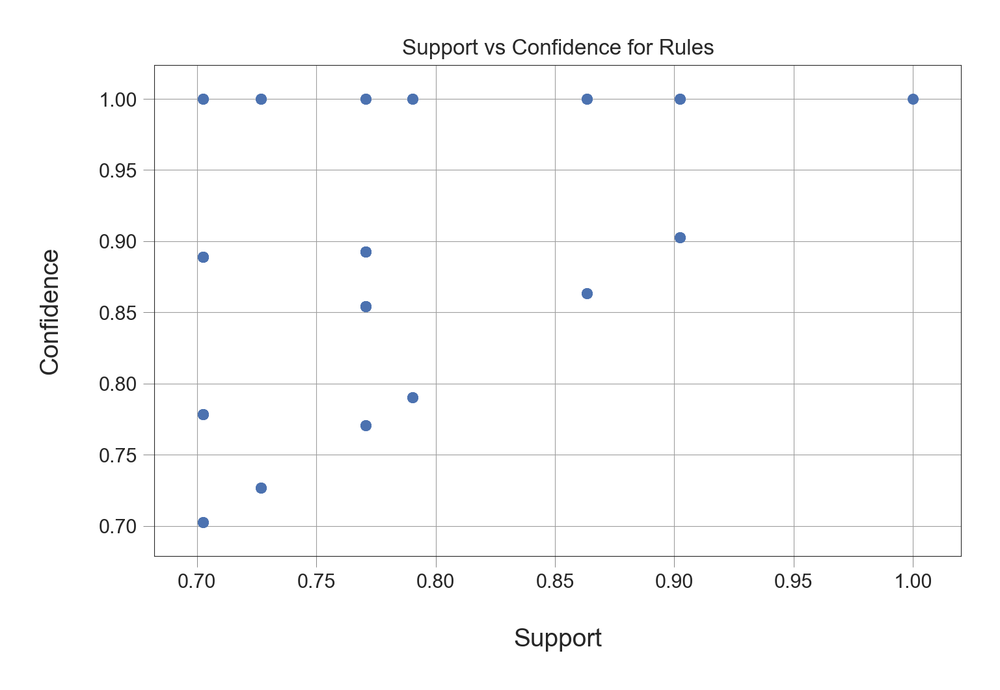

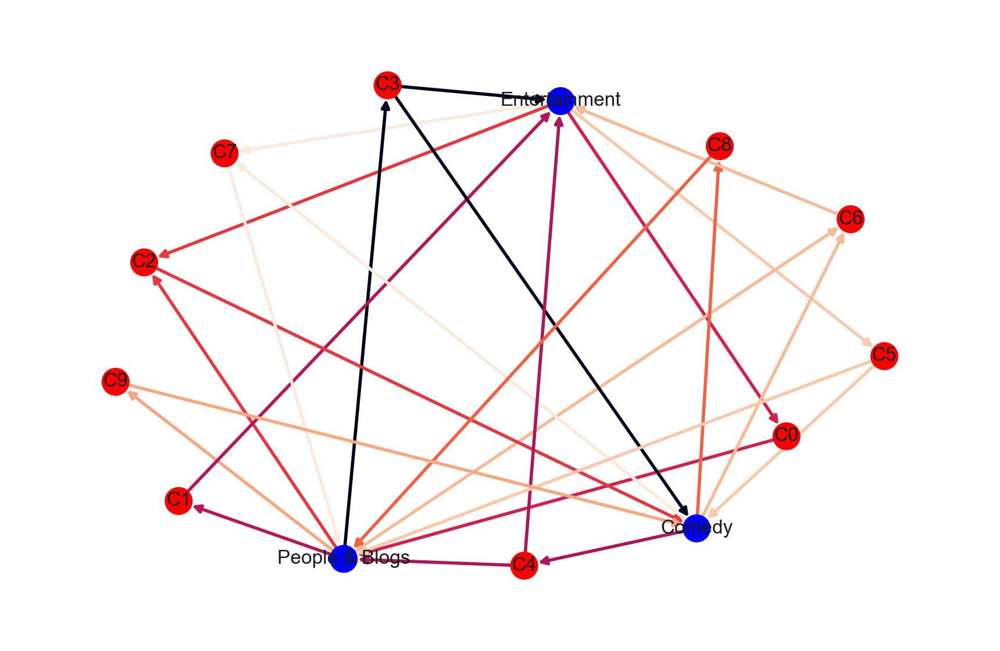

## **GB**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(Music),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(Music),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


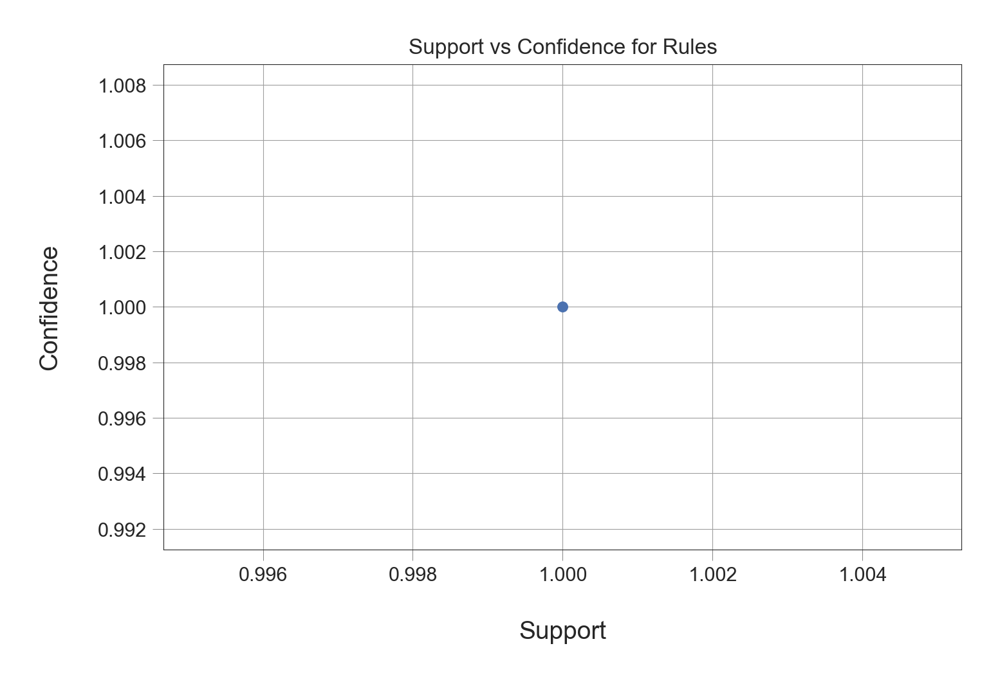

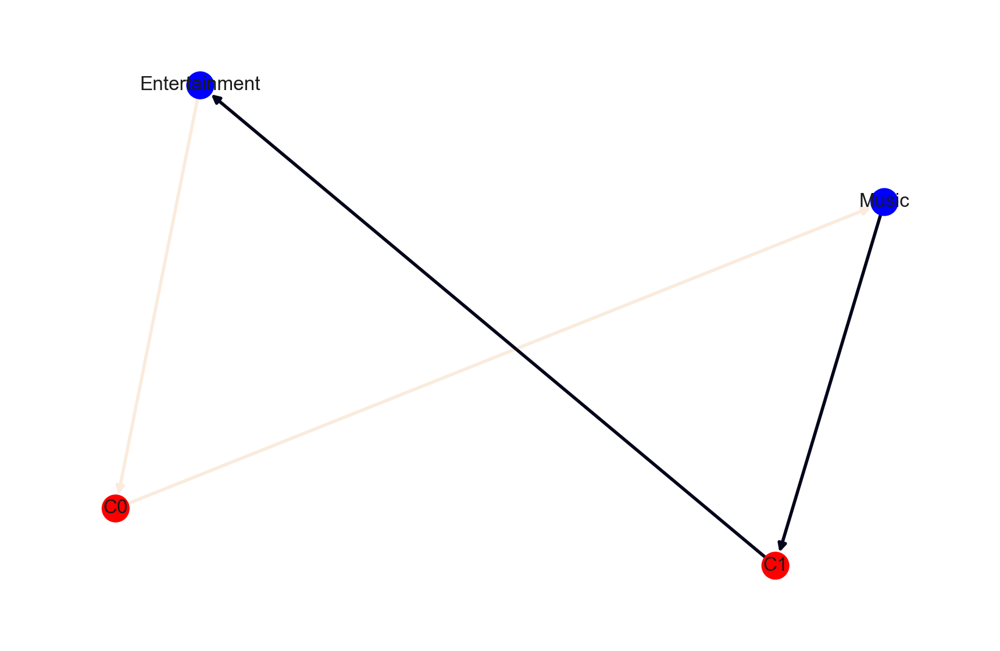

## **IN**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(News & Politics),1.00,0.87,0.87,0.87,1.00,0.00,1.00
1,(News & Politics),(Entertainment),0.87,1.00,0.87,1.00,1.00,0.00,inf


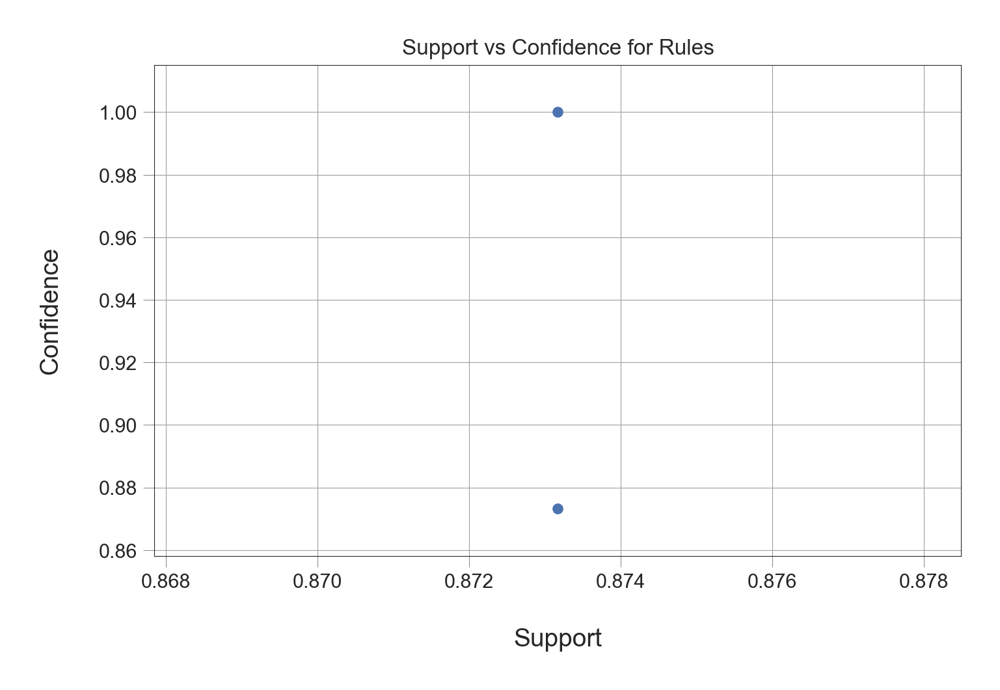

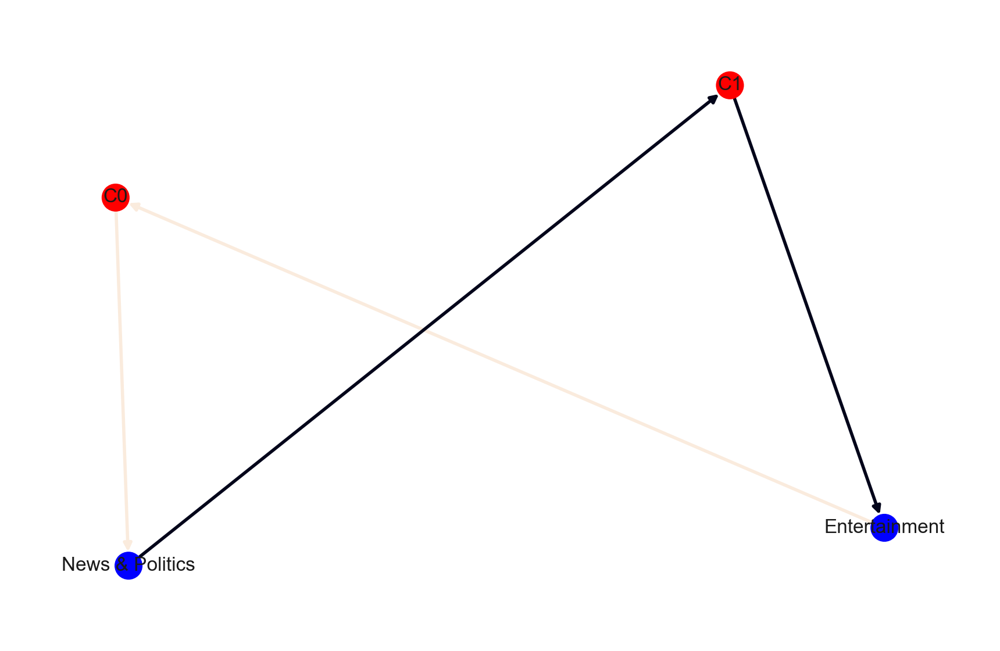

## **US**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(Music),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(Music),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
7,"(Howto & Style, Music)",(Entertainment),0.93,1.00,0.93,1.00,1.00,0.00,inf
11,(Music),"(Howto & Style, Entertainment)",1.00,0.93,0.93,0.93,1.00,0.00,1.00
10,(Entertainment),"(Howto & Style, Music)",1.00,0.93,0.93,0.93,1.00,0.00,1.00
8,"(Entertainment, Music)",(Howto & Style),1.00,0.93,0.93,0.93,1.00,0.00,1.00
9,(Howto & Style),"(Entertainment, Music)",0.93,1.00,0.93,1.00,1.00,0.00,inf
6,"(Howto & Style, Entertainment)",(Music),0.93,1.00,0.93,1.00,1.00,0.00,inf
5,(Music),(Howto & Style),1.00,0.93,0.93,0.93,1.00,0.00,1.00
4,(Howto & Style),(Music),0.93,1.00,0.93,1.00,1.00,0.00,inf


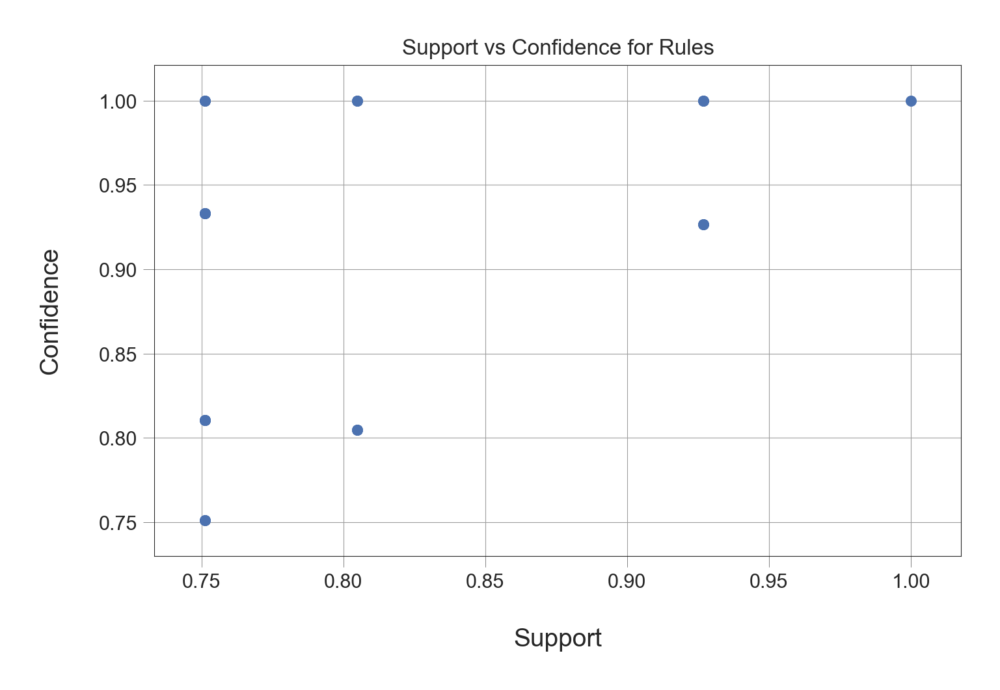

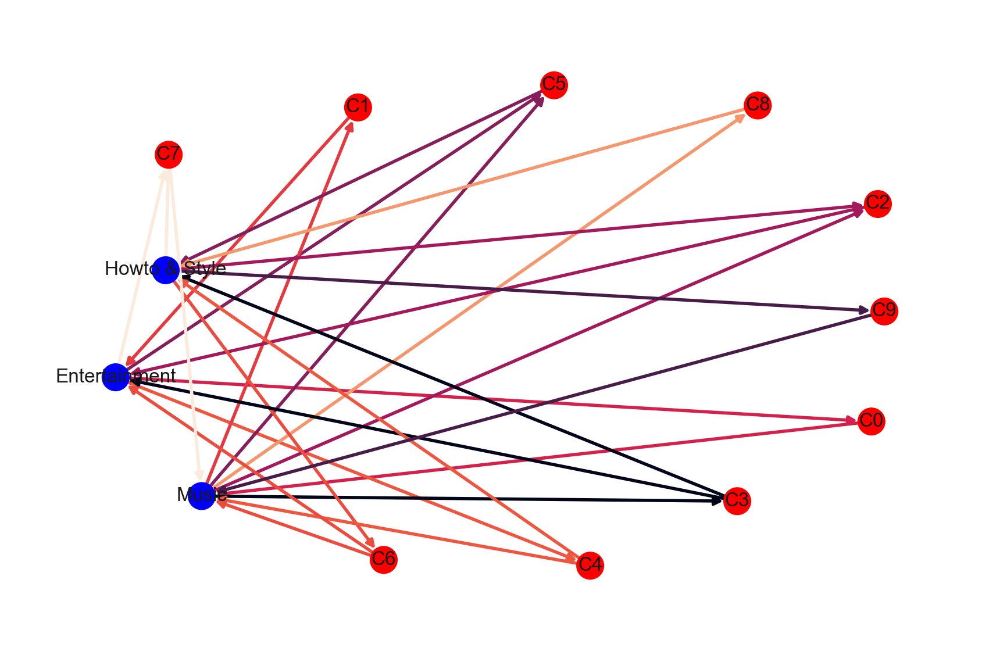

## **MX**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf


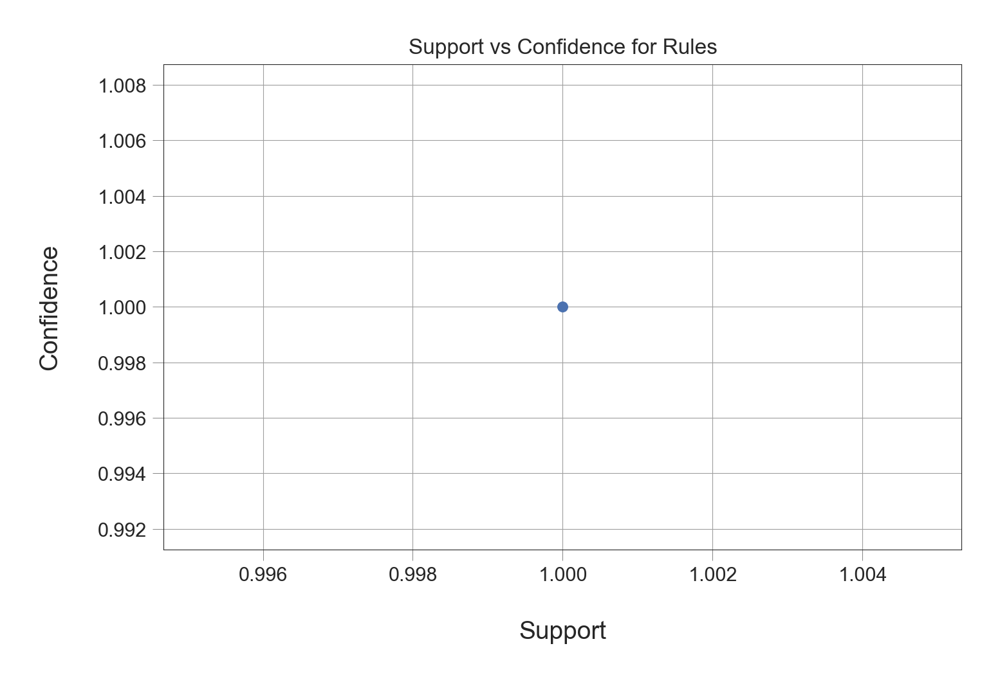

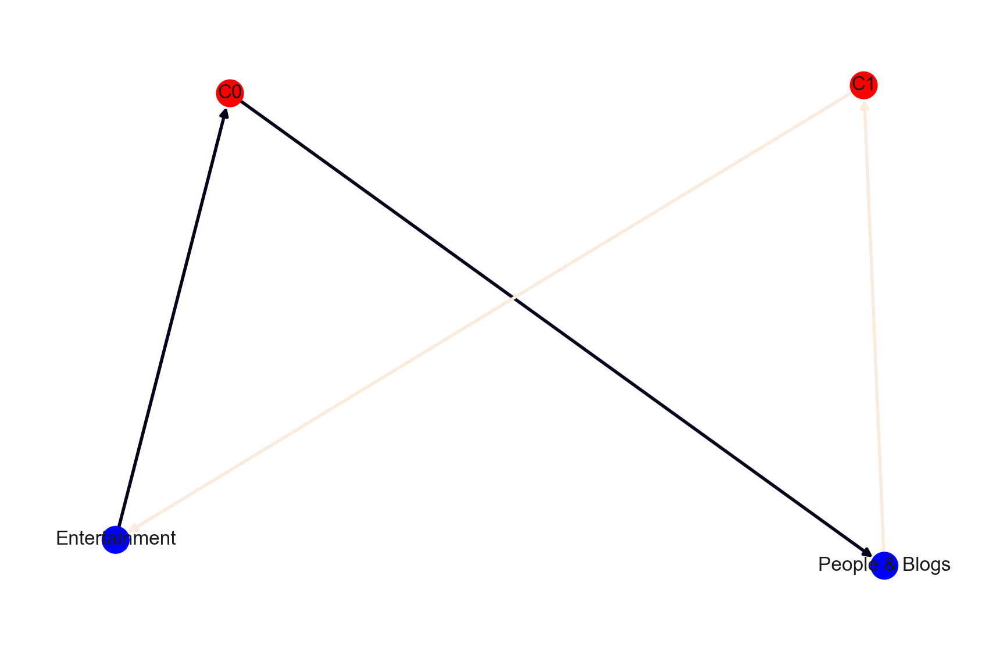

## **JP**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(Entertainment),(People & Blogs),1.00,0.95,0.95,0.95,1.00,0.00,1.00
1,(People & Blogs),(Entertainment),0.95,1.00,0.95,1.00,1.00,0.00,inf


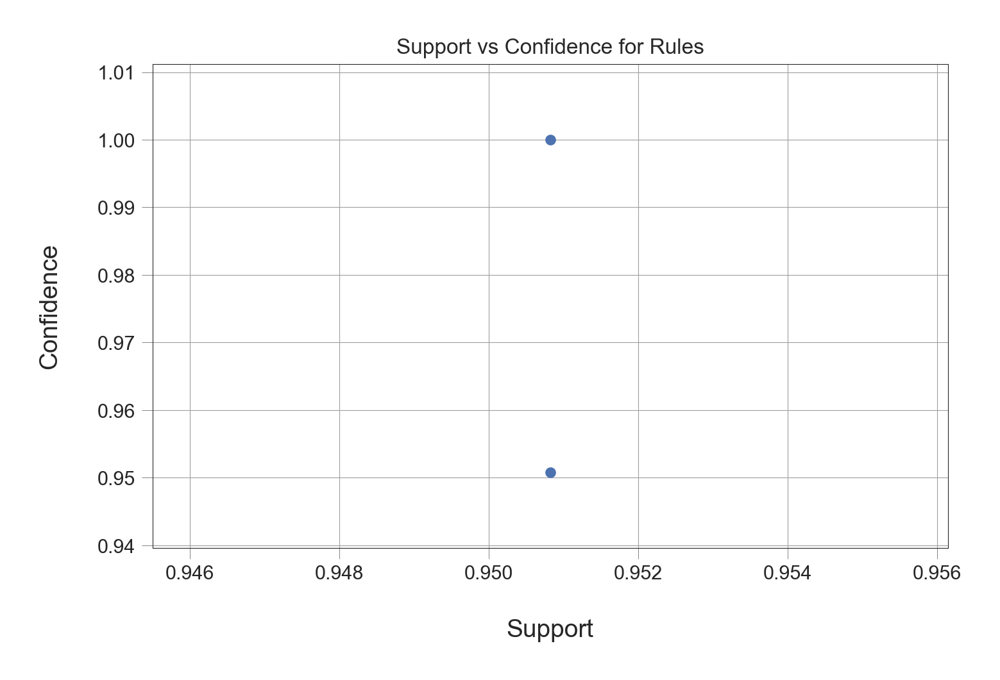

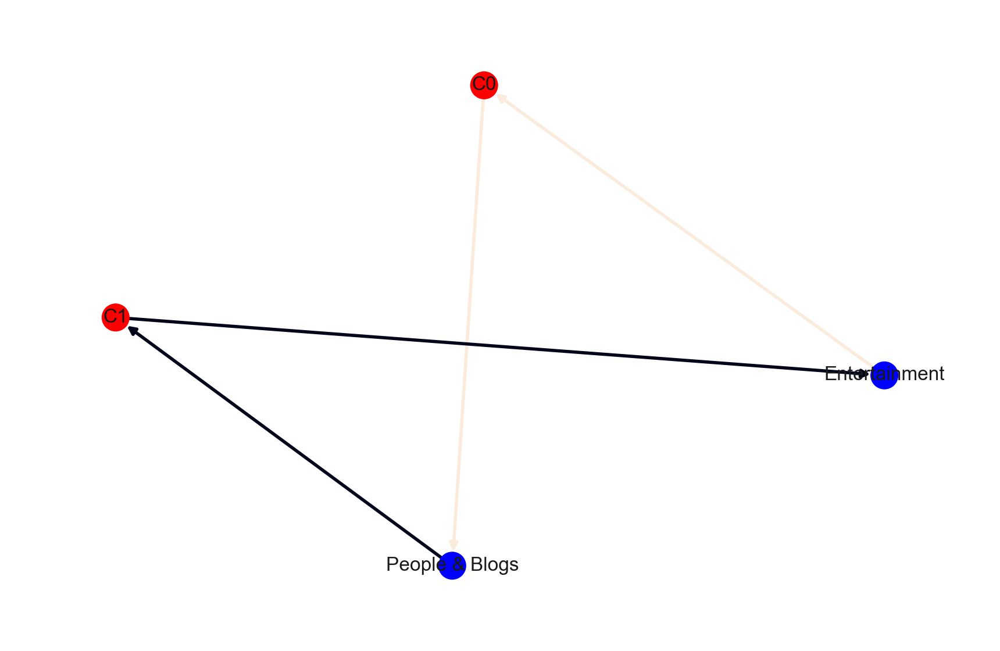

## **KR**

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(People & Blogs),(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
1,(News & Politics),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
2,(Entertainment),(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
3,(People & Blogs),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
4,(Entertainment),(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
5,(News & Politics),(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
6,"(Entertainment, News & Politics)",(People & Blogs),1.00,1.00,1.00,1.00,1.00,0.00,inf
7,"(Entertainment, People & Blogs)",(News & Politics),1.00,1.00,1.00,1.00,1.00,0.00,inf
8,"(People & Blogs, News & Politics)",(Entertainment),1.00,1.00,1.00,1.00,1.00,0.00,inf
9,(Entertainment),"(People & Blogs, News & Politics)",1.00,1.00,1.00,1.00,1.00,0.00,inf


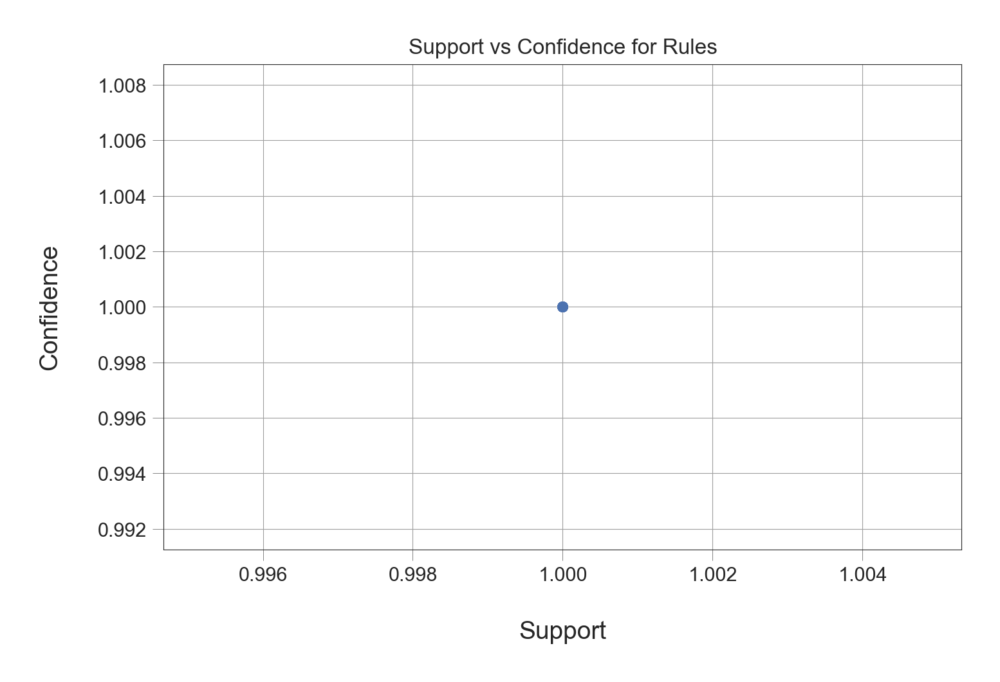

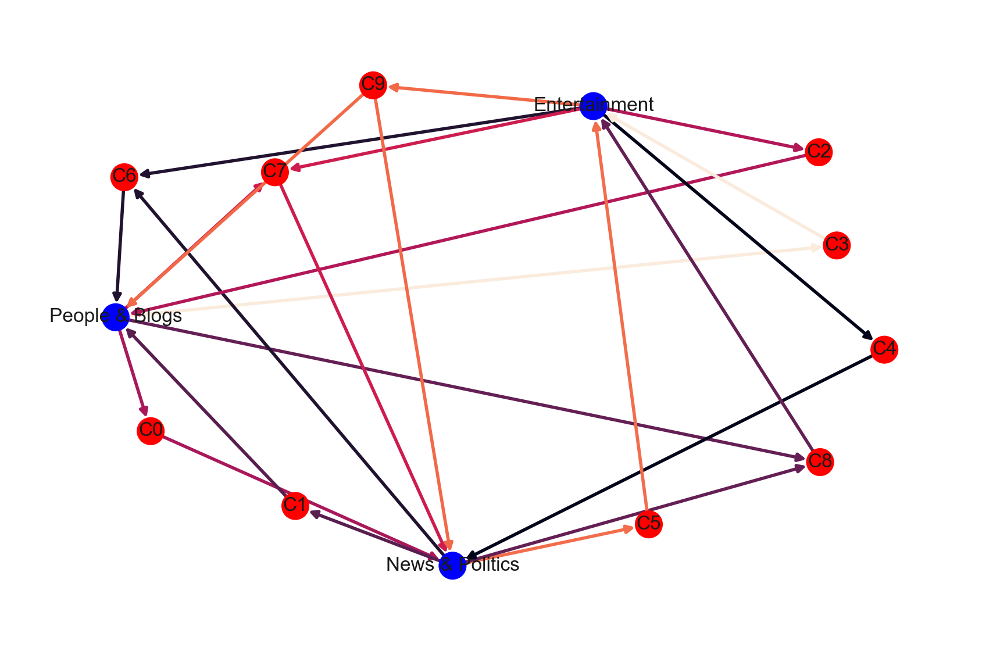

27.92269778251648


In [10]:
start = time.time()
for i in datasets:
    rules, no_of_rules = fpGrowth1(i)
    linkage(rules,no_of_rules ) 
runtime = (time.time() - start)
print(runtime)